# Coursework 2 for Cardiac MR Image Segmentation (2020-2021)



# 1. Introduction

In clinical cardiology it is important to correctly assess the structure and function of the heart in order to precisely diagnose the heart condition of the patient. Convolutional Neural Networks (CNNs) have been proven very effective in classification, segmentation and object detection (Milletari et al 2016). Therefore, CNN method is widely used in cardiac magnetic resonance (CMR) images, to facilitate the clinicians’ evaluation (Chen et al 2020, Dangi et al 2019, Shelhamer et al 2017).
We have been given CMR grey-scale images to train a network to segment them into four regions: background (BG), left ventricle (LV), right ventricle (RV), and myocardium (Myo), as represented in Figure 2. Since the images are gray-scale, we consider the input as a matrix of pixel values ranging from 0 to 255. Usually, an image has 3 channels for each colour (red, green and blue). Conversely, a grayscale image has just 1 channel (single 2D matrix). In CNN, the image features are learned and the relationship between pixels are preserved. This is called semantic segmentation, where each pixel of an image is linked to a class label (in our case we will have 4 classes). Figure 1 depicts the Convolution of an image matrix, the kernel matrix and the output image matrix. The kernel matrix (filter) slides by 1 pixel over the original image, and for every step, it is computed the multiplication between the 2 matrices, giving a single element output in the Activation Map (Schirmbeck et al 2004).

![Image1and2](<./Figure1and2.png>)

The accuracy of CMR semantic segmentation is improved by fine-tuning the training hyperparameters: network architecture, loss functions, dropout layers, early stopping, adaptive learning rate and optimisers. However, due to the high variety of hyperparameters choice and due to the stochastic nature of deep learning, the CNN behaviour estimation is very challenging. Therefore, the choices we have made on the design to optimise the CNN performance can be considered under-explored, as it was only based on journal research.

# 2. Implementation

In this chapter we describe the design choice of our CNN model and why we have chosen it. With our aim being to optimise the network performance, different parameters were taken into consideration. 


## 2.1 Network Architecture

Deep convolutional neural networks have proven to be very successful in image segmentation. The most straightforward model architecture for semantic segmentation is considered to be the Fully Convolutional Network (FCN). In a study made by Desai et al (2019), U-Net, SegNet, and DeeplabV3+ CNN architectures appeared to be most appropriate for semantic segmentation. The SegNet architecture up-samples feature maps through storing them in pooling indices, avoiding computational overhead with regards to encoded weights. Conversely, U-Net (Figure 3) transfers feature maps from encoder to decoder; integration of information from its two network pathways as well as the up-sampling in the expansive path, allows the architecture to be more effective in learning complex structures with increased accuracy in pixel-wise classification. The DeepLab network does not encompass the up-sampling U-Net does, though DeepNet does implement bilinear up-sampling to re-establish the input resolution. The down-sampling from the first input layers of this network do, however, result in loss of accuracy (Nogueira et al., 2020).

![Image3](<./Figure3.png>)

SegNet and U-Net seem to be accurate for musculoskeletal MRI semantic segmentation, in opposition to DeepLab, so we decided to exclude DeepLab  (Norman et al 2018, Liu et al 2018, Chen et al 2017). In a study by Ronneberger et al (2015), the U-Net achieves very good performance in various biomedical segmentation, as it only needs a small amount of images (has dropout layers that help with the overfitting) and presents a satisfactory training time (Weng et al 2019). Therefore we decided to use U-Net.

![Image4](<./Figure4.png "Figure 4">)

AlexNet (Figure 4) is also a FCN, and it provides a competitive computational time ratio, due to the ReLU function within the non-linear section of the network, instead of the sigmoid or Tanh functions used in previous networks. The ReLU layer is implemented following every convolution and fully-connected layer, allowing large models to be trained with a reduced training time (Bueno et al 2020). In comparison, U-Net also utilises the ReLU activation, but follows each convolution with this activation and a max pooling operation. Alex-net features a reduction in size of the feature map, which enables there to be fewer parameters within the network; good if you have low computational power as we did, however as we conducted more research, we concluded that Alex-net is not the most appropriate architecture for segmenting Biomedical data. Nevertheless, we decided to use an adaption of Alex-net as our first network architecture since not much research had been done at the time. We decided to keep it to compare it directly with the more suitable architecture, U-net, and also to reinforce our other hyperparameter comparisons.

Below we present the code for our first network - the simplified version of FCN Alex-net, the orginial we based this off, and lastly our finalised implementation of U-net.

### Our Simplified Alex-Net

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNNSEG(nn.Module): # Define your model
	def __init__(self, num_classes=1):
		super(CNNSEG, self).__init__()
		#Adds one extra class to stand for the zero-padded pixels
		self.num_classes = num_classes + 1

		self.conv1 = nn.Sequential(
			nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, stride=1, padding=1),
			nn.ReLU(),
			nn.MaxPool2d(kernel_size=2, stride=2),
			nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75),
		)

		self.conv2 = nn.Sequential(
			nn.Conv2d(in_channels=32, out_channels=256, kernel_size=5, stride=1, padding=2, groups=2),
			nn.ReLU(),
			nn.MaxPool2d(kernel_size=2, stride=2),
			nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75),
		)
        
		self.conv3 = nn.Sequential(
			nn.Conv2d(in_channels=256, out_channels=512, kernel_size=5, stride=1, padding=2, groups=2),
			nn.ReLU(),
			nn.MaxPool2d(kernel_size=3, stride=2),
			nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75),
		)        

		self.score_conv = nn.Conv2d(in_channels=512, out_channels=num_classes, kernel_size=1, padding=0)
		self.deconv = nn.ConvTranspose2d(in_channels=num_classes, out_channels=num_classes, 
			kernel_size=16, stride=8, bias=False)
		self.out_activation = nn.Softmax((num_classes, 4))

	def forward(self, x):
		out1 = self.conv1(x)
		out2 = self.conv2(out1)
		out3 = self.conv3(out2)
		out_score = self.score_conv(out3)
		out_deconv = self.deconv(out_score)
		return out_deconv
    
model = CNNSEG(num_classes=4) # We can now create a model using your defined segmentation model
print(model)

### Original FCN Alex-net

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.nn.modules.loss
import torch.nn.modules.normalization as norm

class OriginalFCNAlexnet(nn.Module):
	def __init__(self, num_classes=4):
		super(OriginalFCNAlexnet, self).__init__()
		#Adds one extra class to stand for the zero-padded pixels
		self.num_classes = num_classes + 1

		self.conv1 = nn.Sequential(
			nn.Conv2d(in_channels=3, out_channels=96, kernel_size=11, stride=4, padding=100),
			nn.ReLU(),
			nn.MaxPool2d(kernel_size=3, stride=2),
			nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75),
		)

		self.conv2 = nn.Sequential(
			nn.Conv2d(in_channels=96, out_channels=256, kernel_size=5, padding=2, groups=2),
			nn.ReLU(),
			nn.MaxPool2d(kernel_size=3, stride=2),
			nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75),
		)

		self.conv3 = nn.Sequential(
			nn.Conv2d(in_channels=256, out_channels=384, kernel_size=3, padding=1),
			nn.ReLU(),
		)

		self.conv4 = nn.Sequential(
			nn.Conv2d(in_channels=384, out_channels=384, kernel_size=3, padding=1, groups=2),
			nn.ReLU(),
		)

		self.conv5 = nn.Sequential(
			nn.Conv2d(in_channels=384, out_channels=256, kernel_size=3, padding=1, groups=2),
			nn.ReLU(),
			nn.MaxPool2d(kernel_size=3, stride=2),
		)

		self.conv6 = nn.Sequential(
			nn.Conv2d(in_channels=256, out_channels=4096, kernel_size=6),
			nn.ReLU(),
			torch.nn.Dropout(p=0.5, inplace=True),
		)

		self.conv7 = nn.Sequential(
			nn.Conv2d(in_channels=4096, out_channels=4096, kernel_size=1),
			nn.ReLU(),
			torch.nn.Dropout(p=0.5, inplace=True),	
		)

		self.score_conv = nn.Conv2d(in_channels=4096, out_channels=num_classes, kernel_size=1, padding=0)
		self.deconv = nn.ConvTranspose2d(in_channels=num_classes, out_channels=num_classes, 
			kernel_size=63, stride=32, bias=False)

	def forward(self, x):
		out1 = self.conv1(x)
		out2 = self.conv2(out1)
		out3 = self.conv3(out2)
		out4 = self.conv4(out3)
		out5 = self.conv5(out4)
		out6 = self.conv6(out5)
		out7 = self.conv7(out6)
		out_score = self.score_conv(out7)
		out_deconv = self.deconv(out_score)
		return out_deconv
    
model = OriginalFCNAlexnet()
print(model)

### Final U-net

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import collections

# https://github.com/MarciaVaz/brain-segmentation-pytorch.git
# https://github.com/MarciaVaz/brain-segmentation-pytorch/blob/master/train.py

class UNet(nn.Module):

    def __init__(self, in_channels=1, out_channels=4, init_features=32):
        super(UNet, self).__init__()

        features = init_features
        self.encoder1 = UNet._block(in_channels, features, name="enc1")
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = UNet._block(features, features * 2, name="enc2")
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = UNet._block(features * 2, features * 4, name="enc3")
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = UNet._block(features * 4, features * 8, name="enc4")
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = UNet._block(features * 8, features * 16, name="bottleneck")

        self.upconv4 = nn.ConvTranspose2d(
            features * 16, features * 8, kernel_size=2, stride=2
        )
        self.decoder4 = UNet._block((features * 8) * 2, features * 8, name="dec4")
        self.upconv3 = nn.ConvTranspose2d(
            features * 8, features * 4, kernel_size=2, stride=2
        )
        self.decoder3 = UNet._block((features * 4) * 2, features * 4, name="dec3")
        self.upconv2 = nn.ConvTranspose2d(
            features * 4, features * 2, kernel_size=2, stride=2
        )
        self.decoder2 = UNet._block((features * 2) * 2, features * 2, name="dec2")
        self.upconv1 = nn.ConvTranspose2d(
            features * 2, features, kernel_size=2, stride=2
        )
        self.decoder1 = UNet._block(features * 2, features, name="dec1")

        self.conv = nn.Conv2d(
            in_channels=features, out_channels=out_channels, kernel_size=1
        )
        self.out_activation = nn.Softmax((out_channels,4))
       
    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)
        return torch.sigmoid(self.conv(dec1))

    @staticmethod
    def _block(in_channels, features, name):
        return nn.Sequential(
            collections.OrderedDict(
                [
                    (
                        name + "conv1",
                        nn.Conv2d(
                            in_channels=in_channels,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=False,
                        ),
                    ),
                    (name + "norm1", nn.BatchNorm2d(num_features=features)),
                    (name + "relu1", nn.ReLU(inplace=True)),
                    (
                        name + "conv2",
                        nn.Conv2d(
                            in_channels=features,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=False,
                        ),
                    ),
                    (name + "norm2", nn.BatchNorm2d(num_features=features)),
                    (name + "relu2", nn.ReLU(inplace=True)),
                ]
            )
        )

model = UNet()
print(model)

## 2.2 Training the Network

### 2.2.1 DataLoader

Firstly, to train our model we need a training dataset. We have used the provided data loader:

In [ ]:
import torch
import torch.utils.data as data
import cv2
import os
from glob import glob

class TrainDataset(data.Dataset):
    def __init__(self, root=''):
        super(TrainDataset, self).__init__()
        self.img_files = glob(os.path.join(root,'image','*.png'))
        self.mask_files = []
        for img_path in self.img_files:
            basename = os.path.basename(img_path)
            self.mask_files.append(os.path.join(root,'mask',basename[:-4]+'_mask.png'))
            

    def __getitem__(self, index):
            img_path = self.img_files[index]
            mask_path = self.mask_files[index]
            data = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
            label = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
            return torch.from_numpy(data).float(), torch.from_numpy(label).float()

    def __len__(self):
        return len(self.img_files)

### 2.2.2 Image Visualisation

Secondly, we need a method of visualising the MRI image, ground truth mask and predicted mask. We hve used the provided visualisation function and adapted it to include our model's outputs.

In [ ]:
from matplotlib import pyplot as plt

def show_image_mask_pred_mask(img, mask, pred_mask, cmap='gray'): # visualisation
    fig = plt.figure(figsize=(5,5))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap=cmap)
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap=cmap)
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap=cmap)
    plt.axis('off')    

### 2.2.3 Accuracy Calculation

Thirdly, to quantify our models performance we need some way to calculate its training accuracy. We have used the provided categorical_dice function, modified to average over the three class labels, and calculated per-batch. Furthermore, We have created a function that calculates the accuracy of the network on the validation data, after each epoch, so that we can compare it directly with the training accuracy. This allows us to assess our models performance in real time and also check for any overfitting that might occur.

In [23]:
import numpy as np
    
def categorical_dice(mask1, mask2, label_class=1):
    
    mask1_pos = (mask1 == label_class).astype(np.float32)
    mask2_pos = (mask2 == label_class).astype(np.float32)
    dice = 2 * np.sum(mask1_pos * mask2_pos) / (np.sum(mask1_pos) + np.sum(mask2_pos))
    return dice    

def multiclass_categorical_dice(p_tensor_y_true, p_tensor_y_pred):
        
    p_ndarr_y_true = p_tensor_y_true.numpy()
    p_ndarr_y_pred = torch.argmax(p_tensor_y_pred, dim=1).detach().numpy()

    accuracy_1 = categorical_dice(p_ndarr_y_true, p_ndarr_y_pred, label_class=1)
    accuracy_2 = categorical_dice(p_ndarr_y_true, p_ndarr_y_pred, label_class=2)
    accuracy_3 = categorical_dice(p_ndarr_y_true, p_ndarr_y_pred, label_class=3)
    accuracy = (accuracy_1 + accuracy_2 + accuracy_3) / 3
    return accuracy

def get_val_score(p_torch_model, p_str_data_path='./data/val', p_int_num_workers=0, p_int_batch_size=2):
    test_set = TrainDataset(p_str_data_path)
    test_data_loader = DataLoader(dataset=test_set, num_workers=p_int_num_workers, batch_size=p_int_batch_size, shuffle=False)
    batch_accuracy = 0
    for iteration, sample in enumerate(test_data_loader):
        img, mask = sample

        outputs = p_torch_model(img.unsqueeze(1))
        batch_accuracy += multiclass_categorical_dice(p_tensor_y_true=mask, p_tensor_y_pred=outputs)

    epoch_accuracy = batch_accuracy / len(test_data_loader)
    return epoch_accuracy

## 2.3 Data Augmentation

Our network was able to achieve very high training accuracy (95%) using a Unet with not much tuning, however the validation accuracy did not mirror this and was much lower (70%). This immediately confirmed our belief that there would be a limitation in our model based on the dataset. 

We have been given just 100 images for our dataset, and although it would be possible to train a network using only these images, it would not perform well on novel data due to overfitting, as explained by Perez et al (2017). Furthermore, image segmentation can be particularly at risk of overfitting due to probable  class imbalance (Li et al 2019). In lieu of this, we have implemented a range of data augmentation techniques to expand our dataset and produce a more robust network. Augmentations we perform include crops, rotations, flips and erasing, as shown below. 

In [ ]:
from torch.utils.data import DataLoader
import tqdm 
from datetime import datetime
from torchvision import transforms
import random
import torch

transform_train = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomResizedCrop(size=(96, 96), scale=(0.5, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=2),
    transforms.RandomRotation((-180, 180), resample = False, expand = False),
    transforms.Compose([
        transforms.ToTensor(),
        transforms.RandomErasing(p=.1, scale=(0.02, 0.09), ratio=(0.3, 3.3)),
        transforms.ToPILImage(),
    ]),
    transforms.RandomHorizontalFlip(p=.2),
])

def perform_random_transformation(p_np_img, p_np_mask):
    torch_seed = random.randint(-0x8000_0000_0000_0000, 0xffff_ffff_ffff_ffff)   
    np_seed = random.randint(0, 2**32 - 1)
    torch.manual_seed(torch_seed)
    np.random.seed(np_seed)
    img = transform_train(p_np_img)
    torch.manual_seed(torch_seed)  
    np.random.seed(np_seed)
    mask = transform_train(p_np_mask)
    return np.array(img), np.array(mask)

## 2.4 Loss Functions

Loss functions calculate how well an algorithm models the dataset it is provided with. The CNR image dataset mainly consists of background pixels (class 0), with the rest being of the remaining 3 classes (class 1-3). This high-class imbalance and lack of adequate network adaptations can result in bias for the background class in the network during training. Selection of the appropriate loss function, architecture and data augmentation can reduce this bias; Dice and cross-entropy are such loss functions. Dropout layers within the implemented U-Net also reduce this bias however in this task augmentation has been implemented to primarily deal with this (Afzal et al., 2019).  

Cross-entropy is generally used for multiclass categorisation tasks, which measures the performance of the classification model with cross-entropy increasing as the predicted probability output from the model deviates from the actual label of a given input. As opposed to the common MSEloss, cross-entropy penalises the model when a mis-classification occurs to a sufficient degree. The loss function calculation allows the weights of the network to be updated, as the model is trained, reducing the return from the loss function; the Adam optimiser is utilised in this task to perform these updates on the network. (Desai et al 2019)

Dice-coefficient is another loss function used in image segmentation, measuring the overlap between two samples where ranges are measured from 0 to 1, with 1 being complete overlap of the samples. Cross-entropy in some cases is sometimes preferred over dice-coefficient as the gradient provided through cross-entropy loss, due to the softmax incorporated in the function, are stable when p and t are small; dice-coefficient would produce a large gradient in response to this. Conversely, binary-cross entropy is favoured in a balanced dataset, which lacks skew; in this dataset we have an imbalance in the dataset. According to the journal, Dice function is good for accurate optimisation, so we decided to implement this one as well.

The number of epochs in a neural network is a hyperparameter defining the number of passes of the algorithm through the training dataset. A small number of epochs results in underfitting (Barone, Haddow, Germann & Sennrich, 2020) conversely a large number results in overfitting (Yinyin Liu, Starzyk, & Zhen Zhu, 2008). Early stop is a method in which a large number of epochs is used for the training dataset but the training is stopped when performance is no longer improving, (Htut, Cho, & Bowman, 2018) allowing a compromise between the number of epochs. 


#### 1. Cross Entropy Loss

In [ ]:
loss_fn = nn.CrossEntropyLoss()

#### 2. Dice Loss

In [7]:
from torchgeometry.losses import dice

loss_fn = dice.DiceLoss()

## 2.5 Optimisers

Gradient descent is one of the fundamental concepts behind most modern neural networks. It is used to minimize the loss function J(), by updating the model’s parameters in the opposite direction to the loss function’s gradient, based on some mathematical implementation of a learning rate ε. 
From our research it seems that the optimal optimiser is totally dependent on each problem (Ruder 2016, Chen 2020), and there are no best fits for certain architectures or tasks, which makes sense; every loss landscape is different, with different nuances that are more suited to individual optimisers. We have compared two of the most popular and high-performing optimisers (SGD and Adam) as well as some different optimisers that are included in the Pytorch libraries. 

#### 1. SGD

Stochastic gradient descent with momentum, or mini-batch gradient descent, as we have used, is highly dependent on careful tuning of its parameters. It is amongst the oldest methods and is mathematically more basic than most of the other common optimisers, but its simplicity does not stop it performing well, and it continues to be used with great success (Chen 2020, Ruder 2016). Nesterov momentum is preferred as it converges quicker and is more adaptive than classic momentum. 

#### 2. Adam 

The Adaptive moment estimation (Adam) optimiser is widely considered to be among the best optimisers for CNNs (Ruder 2016). The adaptive learning rate we see in this, and many other, optimising methods, along with its storage of previous gradient information, is attractive for smaller, more sparse datasets such as ours as they allow the network to adapt more to the small nuances in the data.

#### 3. AdamW

Our best results have come using the AdamW optimiser. It is not surprising it has worked better than Adam (as it is an improved version of the algorithm), and we did not expect to acheive very high results using SGD due to its limitations described above. 

## 2.6 The Training Algorithm

The layout of our training loop is based on work done previously in Lab 6, and is relatively simple. We print clock time, loss, epoch number, training accuracy and validation accuracy to keep track of these in real time as well as logging them with the wandb website. 

C:\Conda5\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in double_scalars


>>> 14:17:40, Epoch 1/1000, Loss: 0.963, Accuracy: 0.082, Validation Accuracy:  0.139


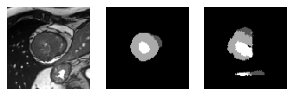

>>> 14:17:56, Epoch 2/1000, Loss: 0.282, Accuracy: 0.125, Validation Accuracy:  0.140


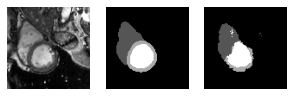

>>> 14:18:11, Epoch 3/1000, Loss: 0.216, Accuracy: 0.144, Validation Accuracy:  0.136


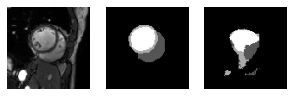

>>> 14:18:27, Epoch 4/1000, Loss: 0.210, Accuracy: nan, Validation Accuracy:  0.140


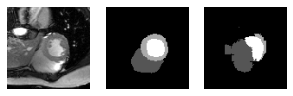

>>> 14:18:44, Epoch 5/1000, Loss: 0.193, Accuracy: 0.162, Validation Accuracy:  0.159


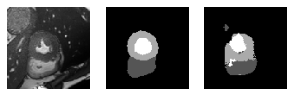

>>> 14:19:02, Epoch 6/1000, Loss: 0.186, Accuracy: nan, Validation Accuracy:  0.139


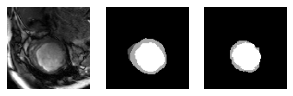

>>> 14:19:18, Epoch 7/1000, Loss: 0.182, Accuracy: 0.166, Validation Accuracy:  0.164


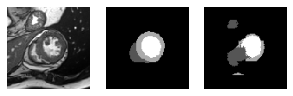

>>> 14:19:34, Epoch 8/1000, Loss: 0.166, Accuracy: 0.169, Validation Accuracy:  0.152


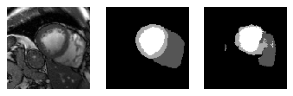

>>> 14:19:49, Epoch 9/1000, Loss: 0.165, Accuracy: 0.160, Validation Accuracy:  0.165


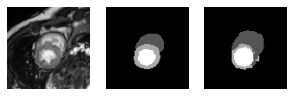

>>> 14:20:05, Epoch 10/1000, Loss: 0.159, Accuracy: nan, Validation Accuracy:  0.163


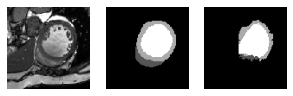

>>> 14:20:20, Epoch 11/1000, Loss: 0.154, Accuracy: 0.177, Validation Accuracy:  0.158


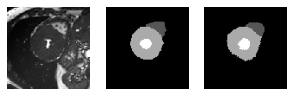

>>> 14:20:36, Epoch 12/1000, Loss: 0.152, Accuracy: 0.182, Validation Accuracy:  0.167


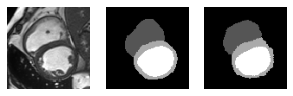

>>> 14:20:51, Epoch 13/1000, Loss: 0.146, Accuracy: 0.176, Validation Accuracy:  0.168


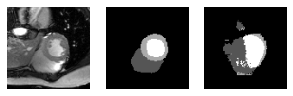

>>> 14:21:06, Epoch 14/1000, Loss: 0.142, Accuracy: nan, Validation Accuracy:  0.162


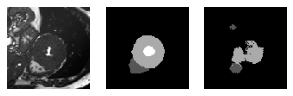

>>> 14:21:22, Epoch 15/1000, Loss: 0.141, Accuracy: 0.184, Validation Accuracy:  0.169


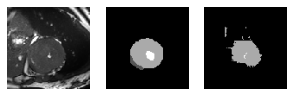

>>> 14:21:38, Epoch 16/1000, Loss: 0.140, Accuracy: 0.182, Validation Accuracy:  0.165


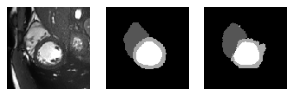

>>> 14:21:53, Epoch 17/1000, Loss: 0.136, Accuracy: 0.186, Validation Accuracy:  0.165


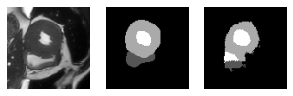

>>> 14:22:09, Epoch 18/1000, Loss: 0.135, Accuracy: nan, Validation Accuracy:  0.159


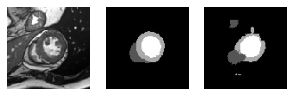

>>> 14:22:25, Epoch 19/1000, Loss: 0.138, Accuracy: nan, Validation Accuracy:  0.158


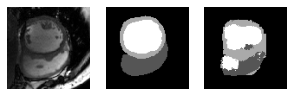

>>> 14:22:40, Epoch 20/1000, Loss: 0.137, Accuracy: 0.185, Validation Accuracy:  0.165


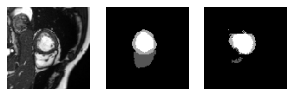

>>> 14:22:56, Epoch 21/1000, Loss: 0.129, Accuracy: 0.190, Validation Accuracy:  0.172


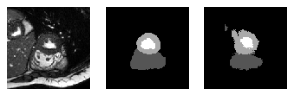

>>> 14:23:12, Epoch 22/1000, Loss: 0.129, Accuracy: nan, Validation Accuracy:  0.166


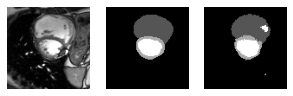

>>> 14:23:27, Epoch 23/1000, Loss: 0.128, Accuracy: 0.188, Validation Accuracy:  0.165


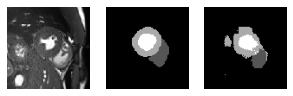

>>> 14:23:43, Epoch 24/1000, Loss: 0.120, Accuracy: 0.192, Validation Accuracy:  0.161


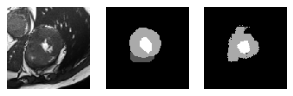

>>> 14:23:58, Epoch 25/1000, Loss: 0.126, Accuracy: 0.179, Validation Accuracy:  0.163


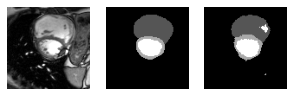

>>> 14:24:14, Epoch 26/1000, Loss: 0.118, Accuracy: nan, Validation Accuracy:  0.167


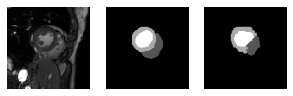

>>> 14:24:30, Epoch 27/1000, Loss: 0.121, Accuracy: nan, Validation Accuracy:  0.162


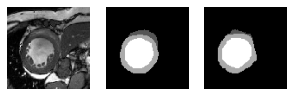

>>> 14:24:46, Epoch 28/1000, Loss: 0.114, Accuracy: nan, Validation Accuracy:  0.170


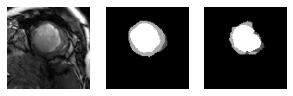

>>> 14:25:02, Epoch 29/1000, Loss: 0.114, Accuracy: 0.192, Validation Accuracy:  0.163


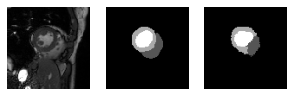

>>> 14:25:18, Epoch 30/1000, Loss: 0.113, Accuracy: 0.198, Validation Accuracy:  0.168


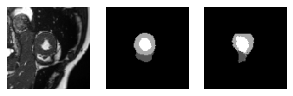

>>> 14:25:33, Epoch 31/1000, Loss: 0.111, Accuracy: nan, Validation Accuracy:  0.169


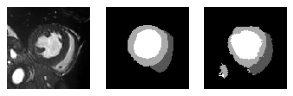

>>> 14:25:49, Epoch 32/1000, Loss: 0.109, Accuracy: 0.200, Validation Accuracy:  0.168


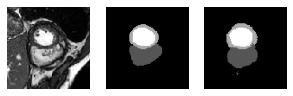

>>> 14:26:04, Epoch 33/1000, Loss: 0.109, Accuracy: nan, Validation Accuracy:  0.170


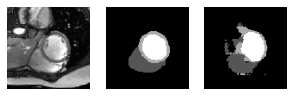

>>> 14:26:20, Epoch 34/1000, Loss: 0.108, Accuracy: nan, Validation Accuracy:  0.169


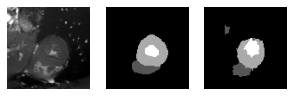

>>> 14:26:46, Epoch 35/1000, Loss: 0.103, Accuracy: 0.196, Validation Accuracy:  0.173


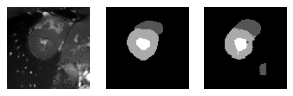

>>> 14:27:02, Epoch 36/1000, Loss: 0.101, Accuracy: 0.198, Validation Accuracy:  0.168


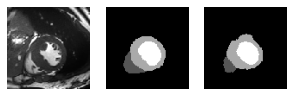

>>> 14:27:21, Epoch 37/1000, Loss: 0.100, Accuracy: 0.202, Validation Accuracy:  0.171


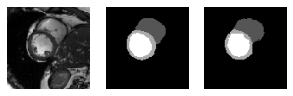

>>> 14:27:40, Epoch 38/1000, Loss: 0.100, Accuracy: nan, Validation Accuracy:  0.173


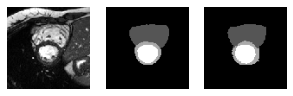

>>> 14:28:02, Epoch 39/1000, Loss: 0.099, Accuracy: 0.203, Validation Accuracy:  0.171


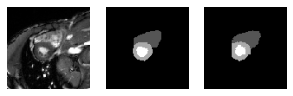

>>> 14:28:23, Epoch 40/1000, Loss: 0.098, Accuracy: nan, Validation Accuracy:  0.175


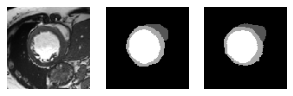

>>> 14:28:44, Epoch 41/1000, Loss: 0.097, Accuracy: 0.197, Validation Accuracy:  0.166


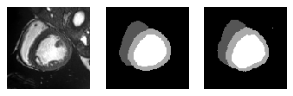

>>> 14:29:04, Epoch 42/1000, Loss: 0.097, Accuracy: 0.198, Validation Accuracy:  0.173


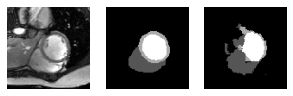

>>> 14:29:24, Epoch 43/1000, Loss: 0.096, Accuracy: nan, Validation Accuracy:  0.170


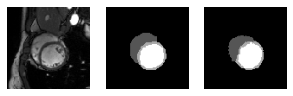

>>> 14:29:43, Epoch 44/1000, Loss: 0.097, Accuracy: 0.201, Validation Accuracy:  0.170


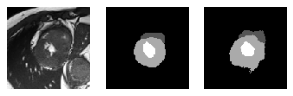

>>> 14:30:01, Epoch 45/1000, Loss: 0.093, Accuracy: nan, Validation Accuracy:  0.171


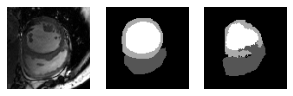

>>> 14:30:20, Epoch 46/1000, Loss: 0.094, Accuracy: 0.200, Validation Accuracy:  0.171


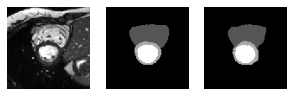

>>> 14:30:44, Epoch 47/1000, Loss: 0.091, Accuracy: 0.209, Validation Accuracy:  0.173


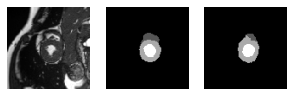

>>> 14:31:10, Epoch 48/1000, Loss: 0.089, Accuracy: 0.199, Validation Accuracy:  0.175


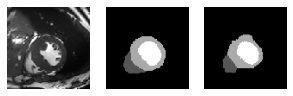

>>> 14:31:29, Epoch 49/1000, Loss: 0.088, Accuracy: 0.201, Validation Accuracy:  0.175


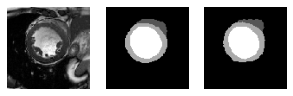

>>> 14:31:47, Epoch 50/1000, Loss: 0.088, Accuracy: 0.209, Validation Accuracy:  0.175


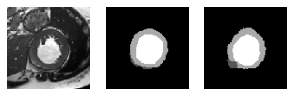

>>> 14:32:05, Epoch 51/1000, Loss: 0.088, Accuracy: 0.206, Validation Accuracy:  0.176


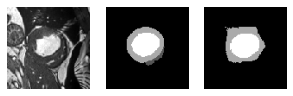

>>> 14:32:23, Epoch 52/1000, Loss: 0.087, Accuracy: 0.203, Validation Accuracy:  0.176


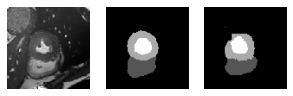

>>> 14:32:44, Epoch 53/1000, Loss: 0.084, Accuracy: 0.208, Validation Accuracy:  0.167


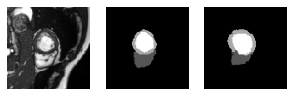

>>> 14:33:07, Epoch 54/1000, Loss: 0.087, Accuracy: 0.208, Validation Accuracy:  0.175


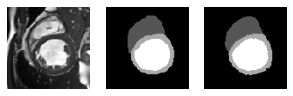

>>> 14:33:28, Epoch 55/1000, Loss: 0.083, Accuracy: 0.204, Validation Accuracy:  0.172


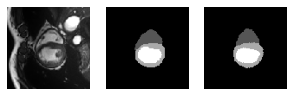

>>> 14:33:48, Epoch 56/1000, Loss: 0.083, Accuracy: 0.201, Validation Accuracy:  0.177


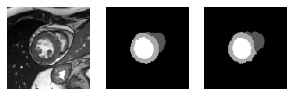

>>> 14:34:07, Epoch 57/1000, Loss: 0.081, Accuracy: 0.207, Validation Accuracy:  0.169


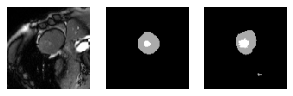

>>> 14:34:27, Epoch 58/1000, Loss: 0.079, Accuracy: 0.207, Validation Accuracy:  0.176


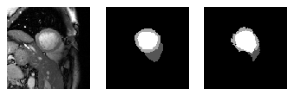

>>> 14:34:46, Epoch 59/1000, Loss: 0.081, Accuracy: 0.215, Validation Accuracy:  0.171


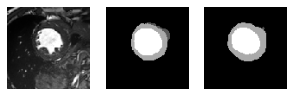

>>> 14:35:03, Epoch 60/1000, Loss: 0.083, Accuracy: 0.205, Validation Accuracy:  0.171


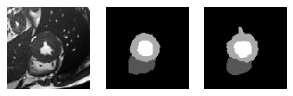

>>> 14:35:21, Epoch 61/1000, Loss: 0.079, Accuracy: 0.206, Validation Accuracy:  0.175


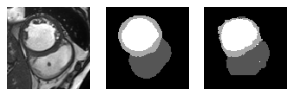

>>> 14:35:41, Epoch 62/1000, Loss: 0.077, Accuracy: 0.208, Validation Accuracy:  0.176


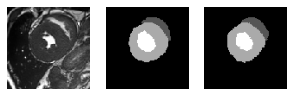

>>> 14:36:00, Epoch 63/1000, Loss: 0.076, Accuracy: 0.212, Validation Accuracy:  0.176


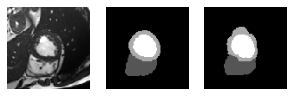

>>> 14:36:20, Epoch 64/1000, Loss: 0.075, Accuracy: 0.215, Validation Accuracy:  0.171


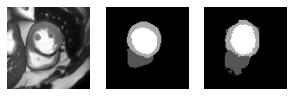

>>> 14:36:41, Epoch 65/1000, Loss: 0.075, Accuracy: 0.210, Validation Accuracy:  0.172


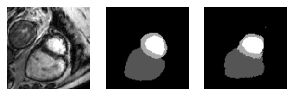

>>> 14:37:02, Epoch 66/1000, Loss: 0.075, Accuracy: nan, Validation Accuracy:  0.176


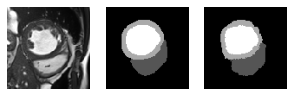

>>> 14:37:22, Epoch 67/1000, Loss: 0.074, Accuracy: nan, Validation Accuracy:  0.175


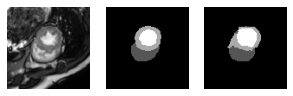

>>> 14:37:44, Epoch 68/1000, Loss: 0.074, Accuracy: nan, Validation Accuracy:  0.176


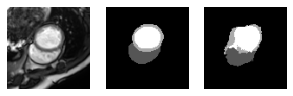

>>> 14:38:03, Epoch 69/1000, Loss: 0.077, Accuracy: nan, Validation Accuracy:  0.172


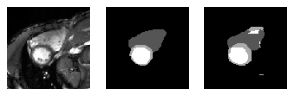

>>> 14:38:23, Epoch 70/1000, Loss: 0.073, Accuracy: 0.215, Validation Accuracy:  0.174


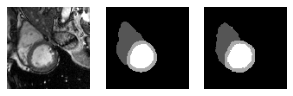

>>> 14:38:43, Epoch 71/1000, Loss: 0.073, Accuracy: 0.213, Validation Accuracy:  0.174


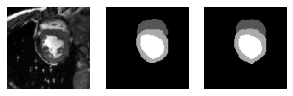

>>> 14:39:01, Epoch 72/1000, Loss: 0.072, Accuracy: nan, Validation Accuracy:  0.173


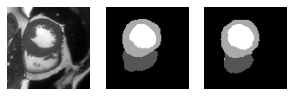

>>> 14:39:19, Epoch 73/1000, Loss: 0.070, Accuracy: 0.214, Validation Accuracy:  0.176


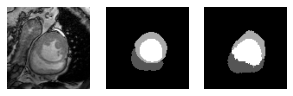

>>> 14:39:37, Epoch 74/1000, Loss: 0.069, Accuracy: nan, Validation Accuracy:  0.171


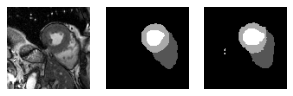

>>> 14:39:56, Epoch 75/1000, Loss: 0.069, Accuracy: 0.213, Validation Accuracy:  0.177


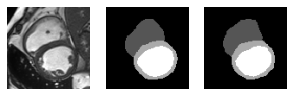

>>> 14:40:14, Epoch 76/1000, Loss: 0.068, Accuracy: 0.215, Validation Accuracy:  0.173


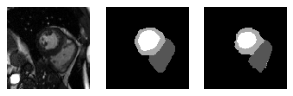

>>> 14:40:32, Epoch 77/1000, Loss: 0.069, Accuracy: 0.212, Validation Accuracy:  0.176


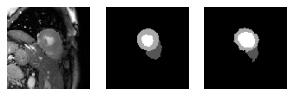

>>> 14:40:51, Epoch 78/1000, Loss: 0.067, Accuracy: 0.215, Validation Accuracy:  0.177


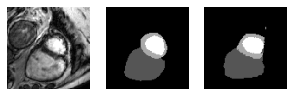

>>> 14:41:09, Epoch 79/1000, Loss: 0.067, Accuracy: 0.215, Validation Accuracy:  0.177


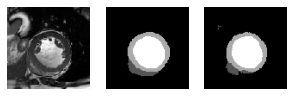

>>> 14:41:27, Epoch 80/1000, Loss: 0.066, Accuracy: 0.214, Validation Accuracy:  0.177


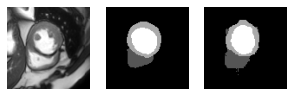

>>> 14:41:46, Epoch 81/1000, Loss: 0.067, Accuracy: 0.211, Validation Accuracy:  0.176


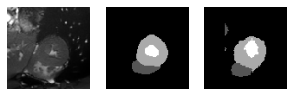

>>> 14:42:04, Epoch 82/1000, Loss: 0.067, Accuracy: nan, Validation Accuracy:  0.176


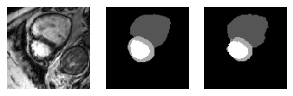

>>> 14:42:25, Epoch 83/1000, Loss: 0.065, Accuracy: 0.217, Validation Accuracy:  0.176


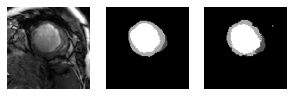

>>> 14:42:50, Epoch 84/1000, Loss: 0.066, Accuracy: 0.217, Validation Accuracy:  0.178


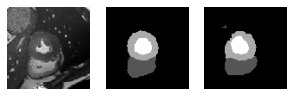

>>> 14:43:11, Epoch 85/1000, Loss: 0.065, Accuracy: 0.213, Validation Accuracy:  0.177


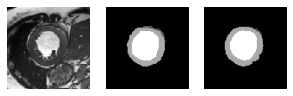

>>> 14:43:33, Epoch 86/1000, Loss: 0.064, Accuracy: 0.215, Validation Accuracy:  0.177


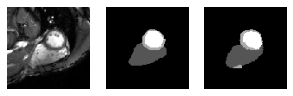

>>> 14:43:54, Epoch 87/1000, Loss: 0.062, Accuracy: 0.214, Validation Accuracy:  0.177


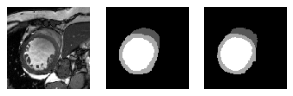

>>> 14:44:16, Epoch 88/1000, Loss: 0.062, Accuracy: 0.214, Validation Accuracy:  0.177


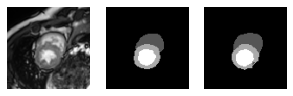

>>> 14:44:36, Epoch 89/1000, Loss: 0.062, Accuracy: 0.219, Validation Accuracy:  0.175


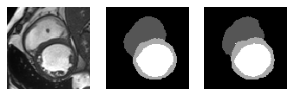

>>> 14:44:56, Epoch 90/1000, Loss: 0.062, Accuracy: nan, Validation Accuracy:  0.177


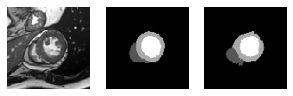

>>> 14:45:17, Epoch 91/1000, Loss: 0.061, Accuracy: 0.216, Validation Accuracy:  0.178


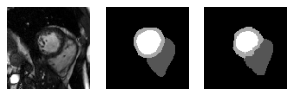

>>> 14:45:43, Epoch 92/1000, Loss: 0.062, Accuracy: 0.216, Validation Accuracy:  0.175


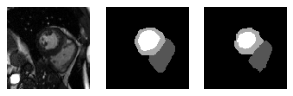

>>> 14:46:04, Epoch 93/1000, Loss: 0.061, Accuracy: 0.220, Validation Accuracy:  0.173


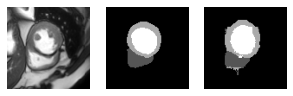

>>> 14:46:24, Epoch 94/1000, Loss: 0.059, Accuracy: 0.218, Validation Accuracy:  0.174


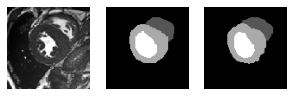

>>> 14:46:44, Epoch 95/1000, Loss: 0.059, Accuracy: 0.218, Validation Accuracy:  0.174


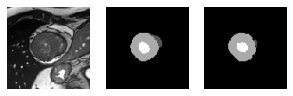

>>> 14:47:04, Epoch 96/1000, Loss: 0.059, Accuracy: nan, Validation Accuracy:  0.178


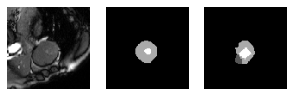

>>> 14:47:24, Epoch 97/1000, Loss: 0.058, Accuracy: 0.221, Validation Accuracy:  0.176


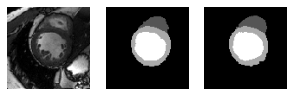

>>> 14:47:47, Epoch 98/1000, Loss: 0.058, Accuracy: 0.219, Validation Accuracy:  0.176


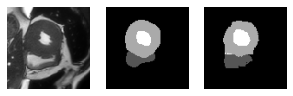

>>> 14:48:08, Epoch 99/1000, Loss: 0.058, Accuracy: nan, Validation Accuracy:  0.176


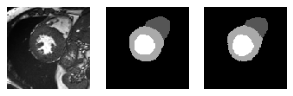

>>> 14:48:31, Epoch 100/1000, Loss: 0.057, Accuracy: 0.219, Validation Accuracy:  0.174


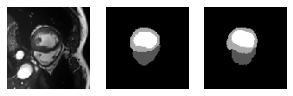

>>> 14:48:55, Epoch 101/1000, Loss: 0.057, Accuracy: nan, Validation Accuracy:  0.179


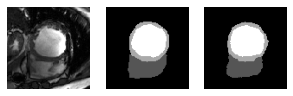

>>> 14:49:17, Epoch 102/1000, Loss: 0.056, Accuracy: 0.218, Validation Accuracy:  0.179


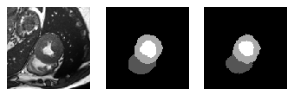

>>> 14:49:37, Epoch 103/1000, Loss: 0.056, Accuracy: 0.221, Validation Accuracy:  0.176


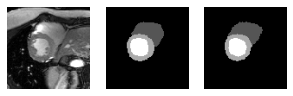

>>> 14:49:58, Epoch 104/1000, Loss: 0.057, Accuracy: 0.221, Validation Accuracy:  0.178


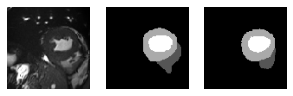

>>> 14:50:19, Epoch 105/1000, Loss: 0.055, Accuracy: 0.224, Validation Accuracy:  0.174


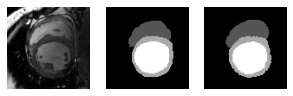

>>> 14:50:41, Epoch 106/1000, Loss: 0.056, Accuracy: nan, Validation Accuracy:  0.177


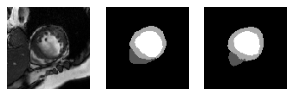

>>> 14:51:02, Epoch 107/1000, Loss: 0.055, Accuracy: 0.221, Validation Accuracy:  0.176


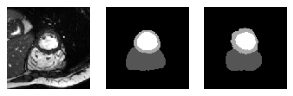

>>> 14:51:23, Epoch 108/1000, Loss: 0.054, Accuracy: 0.222, Validation Accuracy:  0.178


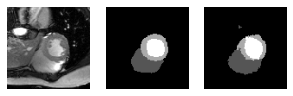

>>> 14:51:45, Epoch 109/1000, Loss: 0.053, Accuracy: 0.220, Validation Accuracy:  0.177


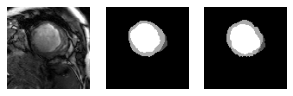

>>> 14:52:06, Epoch 110/1000, Loss: 0.053, Accuracy: 0.220, Validation Accuracy:  0.179


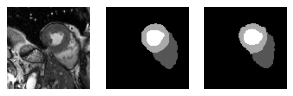

>>> 14:52:30, Epoch 111/1000, Loss: 0.053, Accuracy: 0.220, Validation Accuracy:  0.178


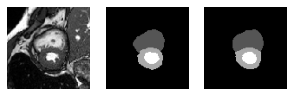

>>> 14:52:54, Epoch 112/1000, Loss: 0.052, Accuracy: nan, Validation Accuracy:  0.178


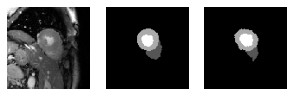

>>> 14:53:16, Epoch 113/1000, Loss: 0.053, Accuracy: 0.222, Validation Accuracy:  0.178


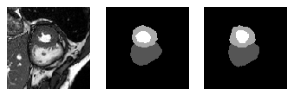

>>> 14:53:40, Epoch 114/1000, Loss: 0.052, Accuracy: 0.220, Validation Accuracy:  0.176


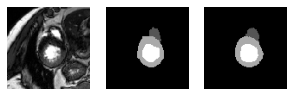

>>> 14:54:01, Epoch 115/1000, Loss: 0.051, Accuracy: 0.219, Validation Accuracy:  0.179


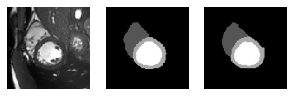

>>> 14:54:27, Epoch 116/1000, Loss: 0.051, Accuracy: 0.220, Validation Accuracy:  0.179


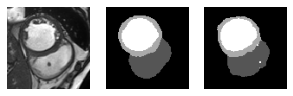

>>> 14:54:53, Epoch 117/1000, Loss: 0.052, Accuracy: 0.221, Validation Accuracy:  0.178


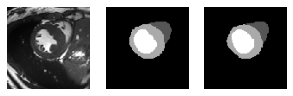

>>> 14:55:17, Epoch 118/1000, Loss: 0.051, Accuracy: 0.224, Validation Accuracy:  0.178


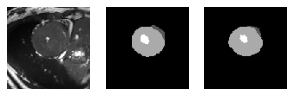

>>> 14:55:41, Epoch 119/1000, Loss: 0.050, Accuracy: 0.222, Validation Accuracy:  0.176


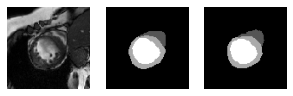

>>> 14:56:05, Epoch 120/1000, Loss: 0.050, Accuracy: 0.224, Validation Accuracy:  0.178


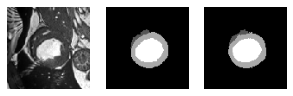

>>> 14:56:28, Epoch 121/1000, Loss: 0.050, Accuracy: nan, Validation Accuracy:  0.178


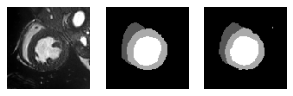

>>> 14:56:53, Epoch 122/1000, Loss: 0.049, Accuracy: nan, Validation Accuracy:  0.178


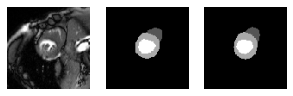

>>> 14:57:20, Epoch 123/1000, Loss: 0.049, Accuracy: 0.225, Validation Accuracy:  0.176


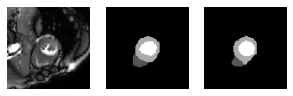

>>> 14:57:38, Epoch 124/1000, Loss: 0.049, Accuracy: 0.223, Validation Accuracy:  0.178


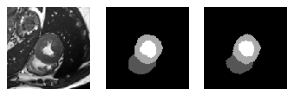

>>> 14:57:54, Epoch 125/1000, Loss: 0.048, Accuracy: nan, Validation Accuracy:  0.179


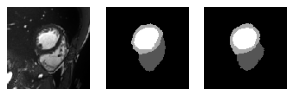

>>> 14:58:09, Epoch 126/1000, Loss: 0.048, Accuracy: 0.223, Validation Accuracy:  0.179


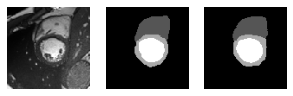

>>> 14:58:25, Epoch 127/1000, Loss: 0.048, Accuracy: 0.222, Validation Accuracy:  0.178


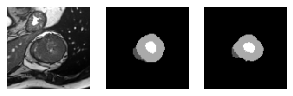

>>> 14:58:40, Epoch 128/1000, Loss: 0.047, Accuracy: 0.222, Validation Accuracy:  0.178


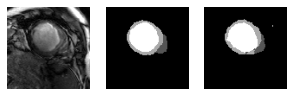

>>> 14:58:56, Epoch 129/1000, Loss: 0.048, Accuracy: 0.220, Validation Accuracy:  0.179


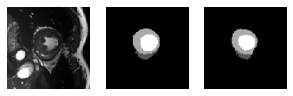

>>> 14:59:12, Epoch 130/1000, Loss: 0.047, Accuracy: 0.226, Validation Accuracy:  0.178


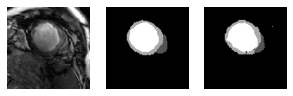

>>> 14:59:28, Epoch 131/1000, Loss: 0.048, Accuracy: 0.223, Validation Accuracy:  0.178


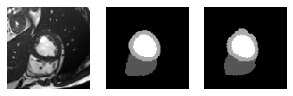

>>> 14:59:43, Epoch 132/1000, Loss: 0.046, Accuracy: 0.224, Validation Accuracy:  0.177


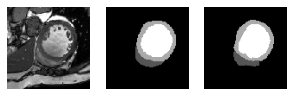

>>> 14:59:59, Epoch 133/1000, Loss: 0.047, Accuracy: nan, Validation Accuracy:  0.178


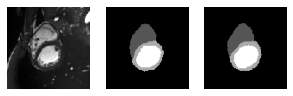

>>> 15:00:14, Epoch 134/1000, Loss: 0.046, Accuracy: 0.226, Validation Accuracy:  0.178


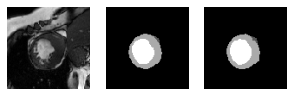

>>> 15:00:30, Epoch 135/1000, Loss: 0.046, Accuracy: 0.225, Validation Accuracy:  0.178


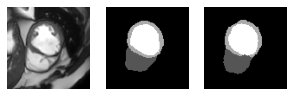

>>> 15:00:46, Epoch 136/1000, Loss: 0.047, Accuracy: 0.224, Validation Accuracy:  0.175


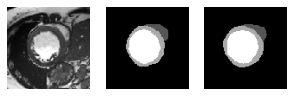

>>> 15:01:02, Epoch 137/1000, Loss: 0.046, Accuracy: 0.226, Validation Accuracy:  0.179


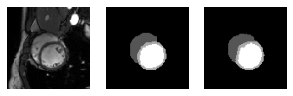

>>> 15:01:17, Epoch 138/1000, Loss: 0.045, Accuracy: 0.226, Validation Accuracy:  0.178


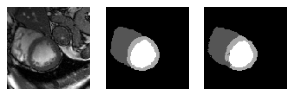

>>> 15:01:32, Epoch 139/1000, Loss: 0.045, Accuracy: 0.226, Validation Accuracy:  0.178


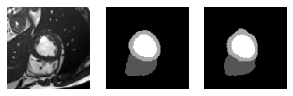

>>> 15:01:48, Epoch 140/1000, Loss: 0.045, Accuracy: nan, Validation Accuracy:  0.178


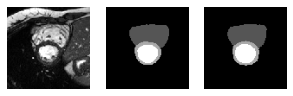

>>> 15:02:03, Epoch 141/1000, Loss: 0.045, Accuracy: nan, Validation Accuracy:  0.179


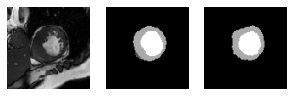

>>> 15:02:18, Epoch 142/1000, Loss: 0.044, Accuracy: 0.229, Validation Accuracy:  0.180


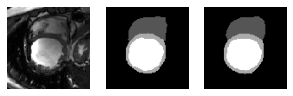

>>> 15:02:33, Epoch 143/1000, Loss: 0.044, Accuracy: 0.226, Validation Accuracy:  0.179


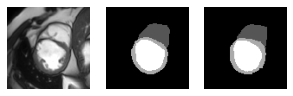

>>> 15:02:49, Epoch 144/1000, Loss: 0.044, Accuracy: nan, Validation Accuracy:  0.178


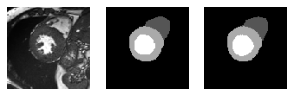

>>> 15:03:04, Epoch 145/1000, Loss: 0.043, Accuracy: 0.227, Validation Accuracy:  0.178


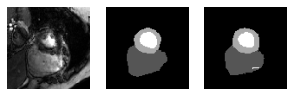

>>> 15:03:20, Epoch 146/1000, Loss: 0.043, Accuracy: 0.228, Validation Accuracy:  0.179


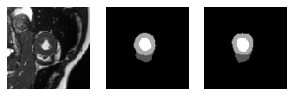

>>> 15:03:35, Epoch 147/1000, Loss: 0.043, Accuracy: 0.226, Validation Accuracy:  0.177


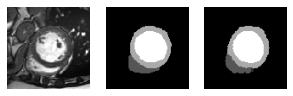

>>> 15:03:50, Epoch 148/1000, Loss: 0.043, Accuracy: 0.226, Validation Accuracy:  0.178


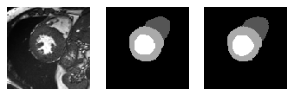

>>> 15:04:06, Epoch 149/1000, Loss: 0.043, Accuracy: 0.223, Validation Accuracy:  0.177


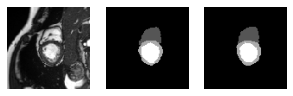

>>> 15:04:21, Epoch 150/1000, Loss: 0.043, Accuracy: nan, Validation Accuracy:  0.179


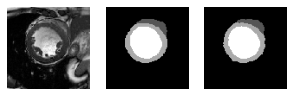

>>> 15:04:37, Epoch 151/1000, Loss: 0.042, Accuracy: 0.227, Validation Accuracy:  0.179


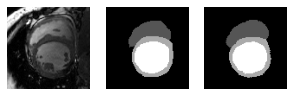

>>> 15:04:52, Epoch 152/1000, Loss: 0.044, Accuracy: 0.227, Validation Accuracy:  0.176


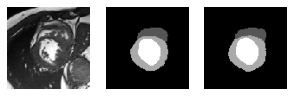

>>> 15:05:08, Epoch 153/1000, Loss: 0.042, Accuracy: nan, Validation Accuracy:  0.179


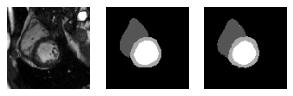

>>> 15:05:23, Epoch 154/1000, Loss: 0.042, Accuracy: 0.226, Validation Accuracy:  0.179


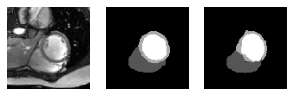

>>> 15:05:44, Epoch 155/1000, Loss: 0.042, Accuracy: 0.227, Validation Accuracy:  0.179


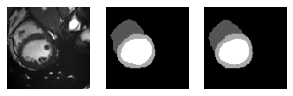

>>> 15:06:04, Epoch 156/1000, Loss: 0.041, Accuracy: nan, Validation Accuracy:  0.179


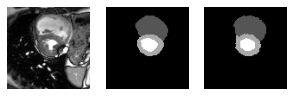

>>> 15:06:31, Epoch 157/1000, Loss: 0.041, Accuracy: 0.226, Validation Accuracy:  0.177


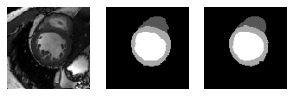

>>> 15:06:51, Epoch 158/1000, Loss: 0.041, Accuracy: 0.226, Validation Accuracy:  0.178


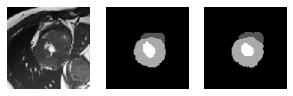

>>> 15:07:09, Epoch 159/1000, Loss: 0.041, Accuracy: nan, Validation Accuracy:  0.179


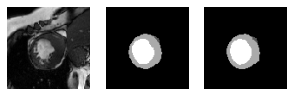

>>> 15:07:30, Epoch 160/1000, Loss: 0.041, Accuracy: 0.226, Validation Accuracy:  0.178


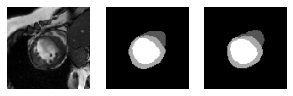

>>> 15:07:47, Epoch 161/1000, Loss: 0.040, Accuracy: 0.227, Validation Accuracy:  0.179


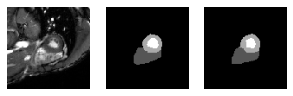

>>> 15:08:04, Epoch 162/1000, Loss: 0.041, Accuracy: 0.229, Validation Accuracy:  0.178


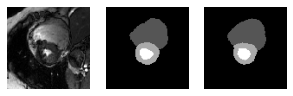

>>> 15:08:21, Epoch 163/1000, Loss: 0.040, Accuracy: nan, Validation Accuracy:  0.178


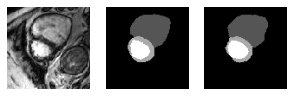

>>> 15:08:37, Epoch 164/1000, Loss: 0.040, Accuracy: 0.231, Validation Accuracy:  0.180


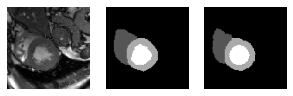

>>> 15:08:53, Epoch 165/1000, Loss: 0.040, Accuracy: 0.224, Validation Accuracy:  0.177


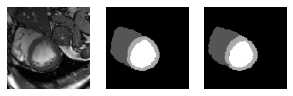

>>> 15:09:08, Epoch 166/1000, Loss: 0.040, Accuracy: nan, Validation Accuracy:  0.179


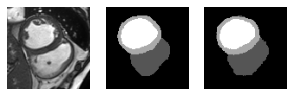

>>> 15:09:23, Epoch 167/1000, Loss: 0.039, Accuracy: 0.230, Validation Accuracy:  0.177


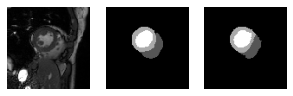

>>> 15:09:40, Epoch 168/1000, Loss: 0.039, Accuracy: nan, Validation Accuracy:  0.179


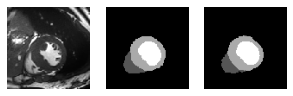

>>> 15:09:55, Epoch 169/1000, Loss: 0.039, Accuracy: 0.228, Validation Accuracy:  0.178


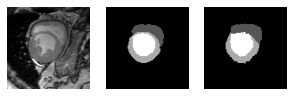

>>> 15:10:12, Epoch 170/1000, Loss: 0.039, Accuracy: nan, Validation Accuracy:  0.178


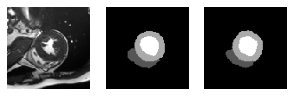

>>> 15:10:30, Epoch 171/1000, Loss: 0.039, Accuracy: nan, Validation Accuracy:  0.178


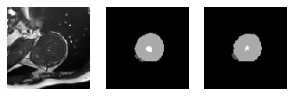

>>> 15:10:47, Epoch 172/1000, Loss: 0.039, Accuracy: nan, Validation Accuracy:  0.178


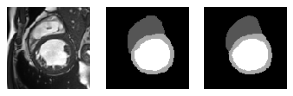

>>> 15:11:04, Epoch 173/1000, Loss: 0.038, Accuracy: 0.229, Validation Accuracy:  0.178


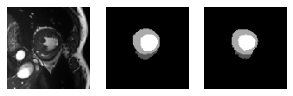

>>> 15:11:21, Epoch 174/1000, Loss: 0.039, Accuracy: 0.229, Validation Accuracy:  0.178


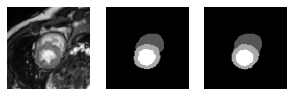

>>> 15:11:37, Epoch 175/1000, Loss: 0.038, Accuracy: 0.228, Validation Accuracy:  0.177


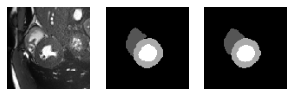

>>> 15:11:53, Epoch 176/1000, Loss: 0.038, Accuracy: 0.231, Validation Accuracy:  0.178


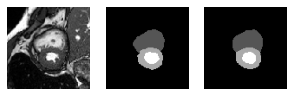

>>> 15:12:09, Epoch 177/1000, Loss: 0.038, Accuracy: 0.231, Validation Accuracy:  0.178


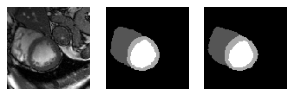

>>> 15:12:25, Epoch 178/1000, Loss: 0.037, Accuracy: 0.232, Validation Accuracy:  0.178


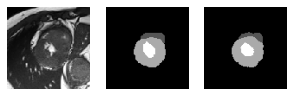

>>> 15:12:42, Epoch 179/1000, Loss: 0.038, Accuracy: 0.229, Validation Accuracy:  0.179


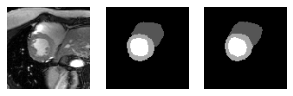

>>> 15:12:58, Epoch 180/1000, Loss: 0.038, Accuracy: 0.228, Validation Accuracy:  0.177


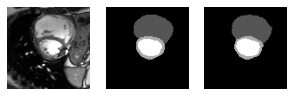

>>> 15:13:14, Epoch 181/1000, Loss: 0.037, Accuracy: 0.229, Validation Accuracy:  0.178


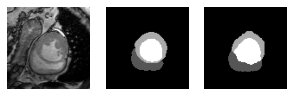

>>> 15:13:30, Epoch 182/1000, Loss: 0.038, Accuracy: 0.231, Validation Accuracy:  0.178


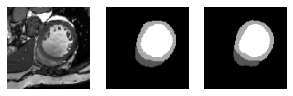

>>> 15:13:47, Epoch 183/1000, Loss: 0.037, Accuracy: 0.232, Validation Accuracy:  0.178


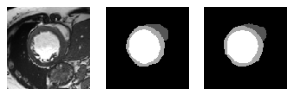

>>> 15:14:03, Epoch 184/1000, Loss: 0.036, Accuracy: 0.230, Validation Accuracy:  0.178


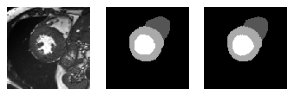

>>> 15:14:20, Epoch 185/1000, Loss: 0.036, Accuracy: nan, Validation Accuracy:  0.178


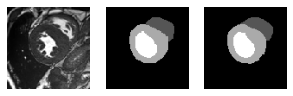

>>> 15:14:37, Epoch 186/1000, Loss: 0.036, Accuracy: nan, Validation Accuracy:  0.178


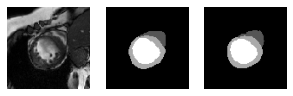

>>> 15:14:53, Epoch 187/1000, Loss: 0.036, Accuracy: 0.232, Validation Accuracy:  0.178


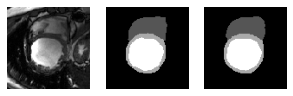

>>> 15:15:08, Epoch 188/1000, Loss: 0.036, Accuracy: 0.230, Validation Accuracy:  0.177


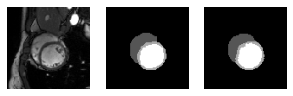

>>> 15:15:24, Epoch 189/1000, Loss: 0.036, Accuracy: nan, Validation Accuracy:  0.178


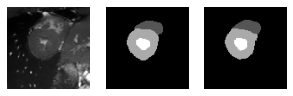

>>> 15:15:40, Epoch 190/1000, Loss: 0.036, Accuracy: 0.231, Validation Accuracy:  0.179


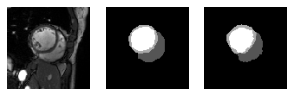

>>> 15:15:56, Epoch 191/1000, Loss: 0.036, Accuracy: 0.231, Validation Accuracy:  0.177


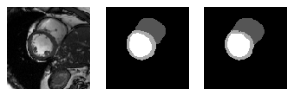

>>> 15:16:12, Epoch 192/1000, Loss: 0.036, Accuracy: 0.230, Validation Accuracy:  0.178


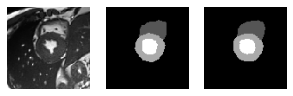

>>> 15:16:28, Epoch 193/1000, Loss: 0.035, Accuracy: 0.231, Validation Accuracy:  0.178


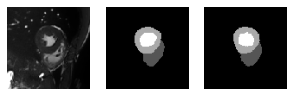

>>> 15:16:45, Epoch 194/1000, Loss: 0.035, Accuracy: nan, Validation Accuracy:  0.178


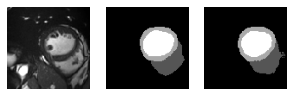

>>> 15:17:02, Epoch 195/1000, Loss: 0.035, Accuracy: nan, Validation Accuracy:  0.178


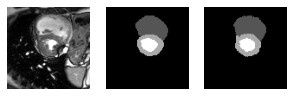

>>> 15:17:22, Epoch 196/1000, Loss: 0.035, Accuracy: 0.230, Validation Accuracy:  0.178


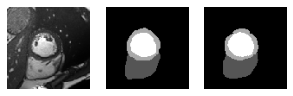

>>> 15:17:40, Epoch 197/1000, Loss: 0.035, Accuracy: 0.232, Validation Accuracy:  0.178


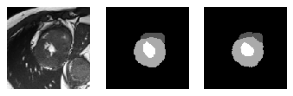

>>> 15:17:58, Epoch 198/1000, Loss: 0.035, Accuracy: 0.233, Validation Accuracy:  0.178


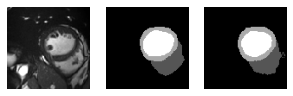

>>> 15:18:15, Epoch 199/1000, Loss: 0.035, Accuracy: 0.233, Validation Accuracy:  0.177


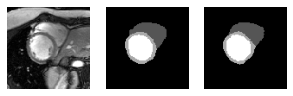

>>> 15:18:33, Epoch 200/1000, Loss: 0.035, Accuracy: 0.231, Validation Accuracy:  0.178


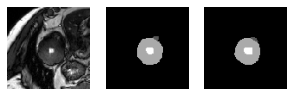

>>> 15:18:50, Epoch 201/1000, Loss: 0.034, Accuracy: 0.230, Validation Accuracy:  0.178


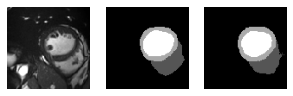

>>> 15:19:07, Epoch 202/1000, Loss: 0.034, Accuracy: 0.231, Validation Accuracy:  0.179


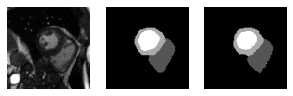

>>> 15:19:23, Epoch 203/1000, Loss: 0.034, Accuracy: nan, Validation Accuracy:  0.178


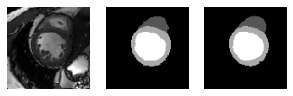

>>> 15:19:39, Epoch 204/1000, Loss: 0.034, Accuracy: 0.229, Validation Accuracy:  0.178


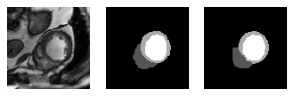

>>> 15:19:55, Epoch 205/1000, Loss: 0.034, Accuracy: 0.231, Validation Accuracy:  0.179


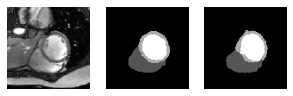

>>> 15:20:11, Epoch 206/1000, Loss: 0.034, Accuracy: 0.232, Validation Accuracy:  0.178


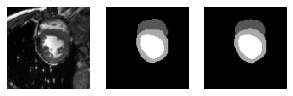

>>> 15:20:28, Epoch 207/1000, Loss: 0.034, Accuracy: 0.228, Validation Accuracy:  0.178


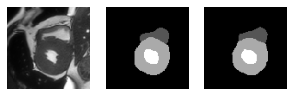

>>> 15:20:45, Epoch 208/1000, Loss: 0.034, Accuracy: nan, Validation Accuracy:  0.178


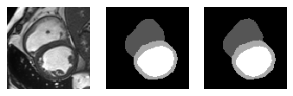

>>> 15:21:02, Epoch 209/1000, Loss: 0.033, Accuracy: 0.234, Validation Accuracy:  0.178


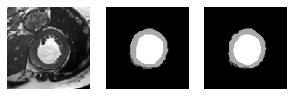

>>> 15:21:19, Epoch 210/1000, Loss: 0.033, Accuracy: 0.232, Validation Accuracy:  0.178


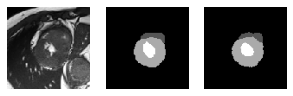

>>> 15:21:35, Epoch 211/1000, Loss: 0.033, Accuracy: 0.231, Validation Accuracy:  0.178


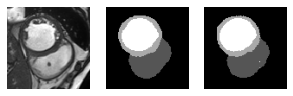

>>> 15:21:52, Epoch 212/1000, Loss: 0.033, Accuracy: nan, Validation Accuracy:  0.178


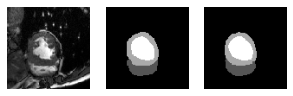

>>> 15:22:08, Epoch 213/1000, Loss: 0.033, Accuracy: 0.231, Validation Accuracy:  0.177


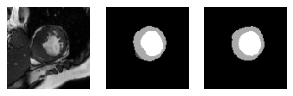

>>> 15:22:24, Epoch 214/1000, Loss: 0.033, Accuracy: nan, Validation Accuracy:  0.177


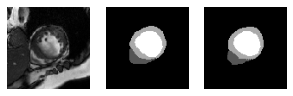

>>> 15:22:41, Epoch 215/1000, Loss: 0.033, Accuracy: 0.232, Validation Accuracy:  0.178


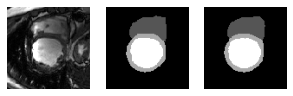

>>> 15:22:57, Epoch 216/1000, Loss: 0.033, Accuracy: 0.231, Validation Accuracy:  0.178


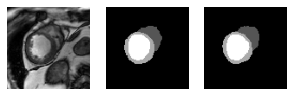

>>> 15:23:14, Epoch 217/1000, Loss: 0.033, Accuracy: 0.233, Validation Accuracy:  0.178


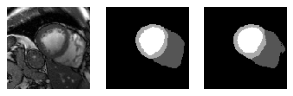

>>> 15:23:30, Epoch 218/1000, Loss: 0.033, Accuracy: nan, Validation Accuracy:  0.178


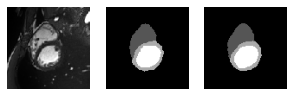

>>> 15:23:46, Epoch 219/1000, Loss: 0.032, Accuracy: nan, Validation Accuracy:  0.178


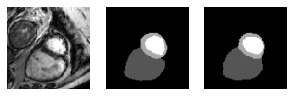

>>> 15:24:02, Epoch 220/1000, Loss: 0.032, Accuracy: 0.232, Validation Accuracy:  0.177


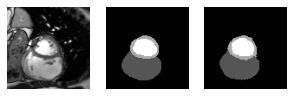

>>> 15:24:22, Epoch 221/1000, Loss: 0.032, Accuracy: 0.235, Validation Accuracy:  0.178


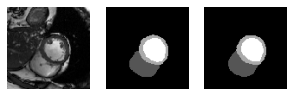

>>> 15:24:41, Epoch 222/1000, Loss: 0.032, Accuracy: 0.234, Validation Accuracy:  0.178


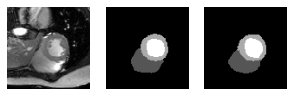

>>> 15:24:58, Epoch 223/1000, Loss: 0.032, Accuracy: 0.232, Validation Accuracy:  0.178


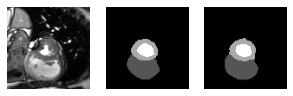

>>> 15:25:15, Epoch 224/1000, Loss: 0.032, Accuracy: nan, Validation Accuracy:  0.178


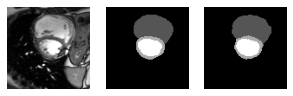

>>> 15:25:35, Epoch 225/1000, Loss: 0.032, Accuracy: 0.231, Validation Accuracy:  0.178


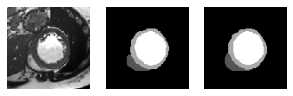

>>> 15:25:56, Epoch 226/1000, Loss: 0.032, Accuracy: nan, Validation Accuracy:  0.177


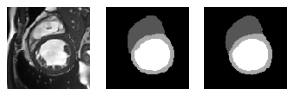

>>> 15:26:15, Epoch 227/1000, Loss: 0.031, Accuracy: 0.235, Validation Accuracy:  0.178


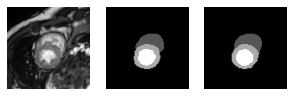

>>> 15:26:31, Epoch 228/1000, Loss: 0.031, Accuracy: nan, Validation Accuracy:  0.177


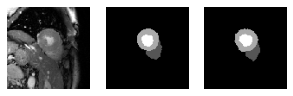

>>> 15:26:47, Epoch 229/1000, Loss: 0.031, Accuracy: 0.231, Validation Accuracy:  0.178


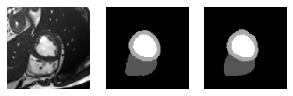

>>> 15:27:04, Epoch 230/1000, Loss: 0.031, Accuracy: nan, Validation Accuracy:  0.179


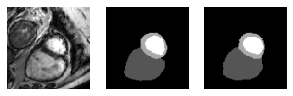

>>> 15:27:21, Epoch 231/1000, Loss: 0.031, Accuracy: 0.235, Validation Accuracy:  0.177


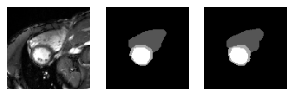

>>> 15:27:38, Epoch 232/1000, Loss: 0.031, Accuracy: nan, Validation Accuracy:  0.178


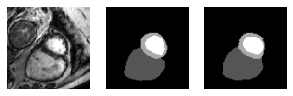

>>> 15:27:54, Epoch 233/1000, Loss: 0.031, Accuracy: 0.235, Validation Accuracy:  0.177


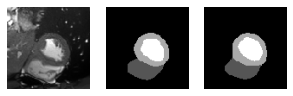

>>> 15:28:10, Epoch 234/1000, Loss: 0.031, Accuracy: 0.234, Validation Accuracy:  0.179


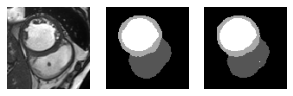

>>> 15:28:26, Epoch 235/1000, Loss: 0.031, Accuracy: 0.235, Validation Accuracy:  0.177


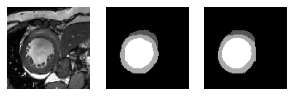

>>> 15:28:43, Epoch 236/1000, Loss: 0.031, Accuracy: nan, Validation Accuracy:  0.178


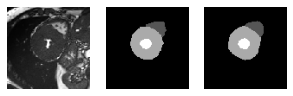

>>> 15:29:00, Epoch 237/1000, Loss: 0.031, Accuracy: nan, Validation Accuracy:  0.177


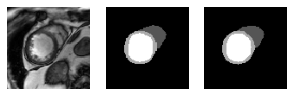

>>> 15:29:16, Epoch 238/1000, Loss: 0.030, Accuracy: 0.233, Validation Accuracy:  0.177


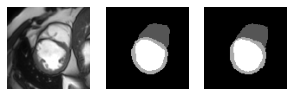

>>> 15:29:32, Epoch 239/1000, Loss: 0.030, Accuracy: 0.234, Validation Accuracy:  0.178


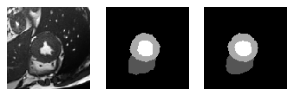

>>> 15:29:48, Epoch 240/1000, Loss: 0.030, Accuracy: nan, Validation Accuracy:  0.178


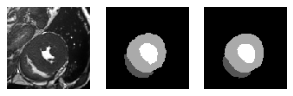

>>> 15:30:05, Epoch 241/1000, Loss: 0.030, Accuracy: 0.233, Validation Accuracy:  0.177


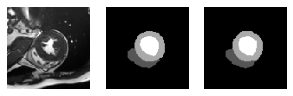

>>> 15:30:20, Epoch 242/1000, Loss: 0.030, Accuracy: nan, Validation Accuracy:  0.178


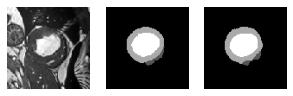

>>> 15:30:37, Epoch 243/1000, Loss: 0.030, Accuracy: nan, Validation Accuracy:  0.177


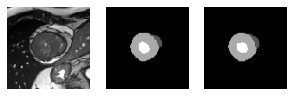

>>> 15:30:53, Epoch 244/1000, Loss: 0.030, Accuracy: 0.236, Validation Accuracy:  0.178


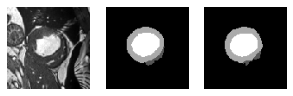

>>> 15:31:10, Epoch 245/1000, Loss: 0.030, Accuracy: nan, Validation Accuracy:  0.177


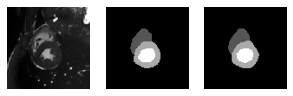

>>> 15:31:27, Epoch 246/1000, Loss: 0.030, Accuracy: 0.236, Validation Accuracy:  0.178


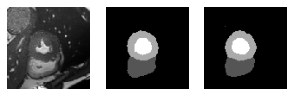

>>> 15:31:44, Epoch 247/1000, Loss: 0.030, Accuracy: 0.233, Validation Accuracy:  0.178


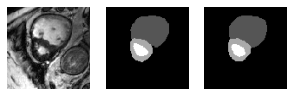

>>> 15:32:00, Epoch 248/1000, Loss: 0.029, Accuracy: 0.233, Validation Accuracy:  0.177


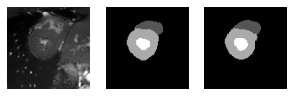

>>> 15:32:16, Epoch 249/1000, Loss: 0.029, Accuracy: 0.233, Validation Accuracy:  0.177


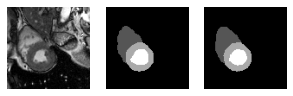

>>> 15:32:32, Epoch 250/1000, Loss: 0.029, Accuracy: 0.234, Validation Accuracy:  0.177


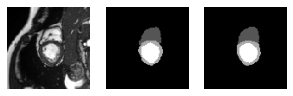

>>> 15:32:50, Epoch 251/1000, Loss: 0.029, Accuracy: 0.232, Validation Accuracy:  0.177


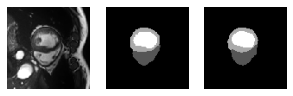

>>> 15:33:06, Epoch 252/1000, Loss: 0.029, Accuracy: nan, Validation Accuracy:  0.177


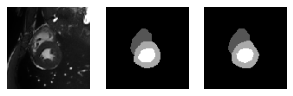

>>> 15:33:22, Epoch 253/1000, Loss: 0.029, Accuracy: 0.234, Validation Accuracy:  0.177


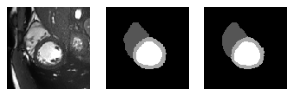

>>> 15:33:38, Epoch 254/1000, Loss: 0.029, Accuracy: 0.236, Validation Accuracy:  0.178


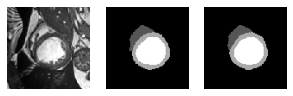

>>> 15:33:54, Epoch 255/1000, Loss: 0.029, Accuracy: nan, Validation Accuracy:  0.178


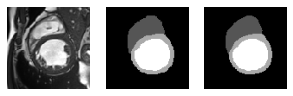

>>> 15:34:11, Epoch 256/1000, Loss: 0.029, Accuracy: nan, Validation Accuracy:  0.177


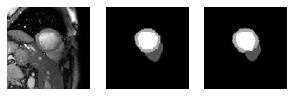

>>> 15:34:26, Epoch 257/1000, Loss: 0.029, Accuracy: 0.234, Validation Accuracy:  0.178


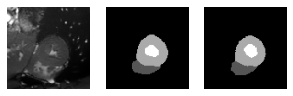

>>> 15:34:43, Epoch 258/1000, Loss: 0.029, Accuracy: 0.237, Validation Accuracy:  0.177


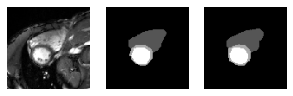

>>> 15:34:59, Epoch 259/1000, Loss: 0.029, Accuracy: 0.236, Validation Accuracy:  0.177


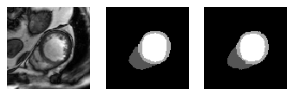

>>> 15:35:15, Epoch 260/1000, Loss: 0.028, Accuracy: 0.231, Validation Accuracy:  0.178


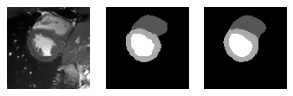

>>> 15:35:32, Epoch 261/1000, Loss: 0.029, Accuracy: 0.236, Validation Accuracy:  0.177


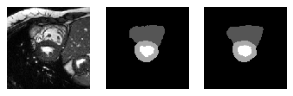

>>> 15:35:48, Epoch 262/1000, Loss: 0.028, Accuracy: 0.235, Validation Accuracy:  0.177


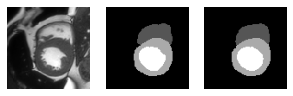

>>> 15:36:04, Epoch 263/1000, Loss: 0.028, Accuracy: 0.234, Validation Accuracy:  0.178


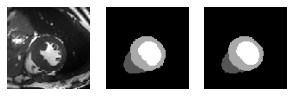

>>> 15:36:20, Epoch 264/1000, Loss: 0.028, Accuracy: 0.236, Validation Accuracy:  0.176


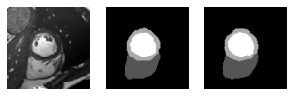

>>> 15:36:36, Epoch 265/1000, Loss: 0.028, Accuracy: 0.234, Validation Accuracy:  0.177


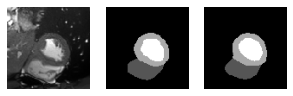

>>> 15:36:52, Epoch 266/1000, Loss: 0.028, Accuracy: 0.233, Validation Accuracy:  0.178


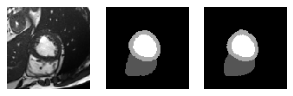

>>> 15:37:08, Epoch 267/1000, Loss: 0.028, Accuracy: 0.237, Validation Accuracy:  0.177


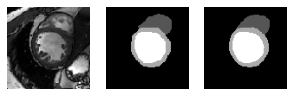

>>> 15:37:25, Epoch 268/1000, Loss: 0.028, Accuracy: 0.237, Validation Accuracy:  0.177


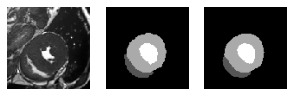

>>> 15:37:42, Epoch 269/1000, Loss: 0.028, Accuracy: nan, Validation Accuracy:  0.177


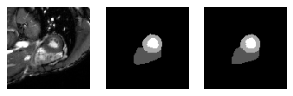

>>> 15:37:58, Epoch 270/1000, Loss: 0.028, Accuracy: 0.236, Validation Accuracy:  0.178


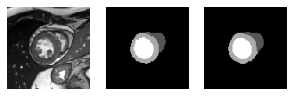

>>> 15:38:14, Epoch 271/1000, Loss: 0.028, Accuracy: nan, Validation Accuracy:  0.178


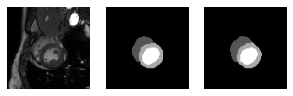

>>> 15:38:30, Epoch 272/1000, Loss: 0.028, Accuracy: 0.233, Validation Accuracy:  0.178


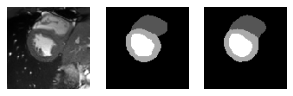

>>> 15:38:47, Epoch 273/1000, Loss: 0.028, Accuracy: 0.235, Validation Accuracy:  0.177


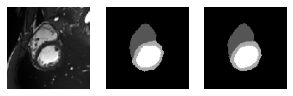

>>> 15:39:03, Epoch 274/1000, Loss: 0.027, Accuracy: 0.236, Validation Accuracy:  0.177


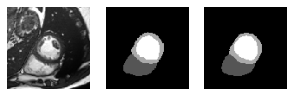

>>> 15:39:19, Epoch 275/1000, Loss: 0.027, Accuracy: 0.234, Validation Accuracy:  0.177


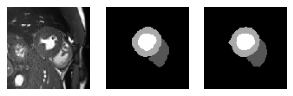

>>> 15:39:35, Epoch 276/1000, Loss: 0.028, Accuracy: nan, Validation Accuracy:  0.177


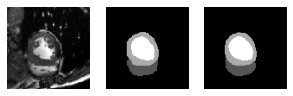

>>> 15:39:51, Epoch 277/1000, Loss: 0.027, Accuracy: 0.237, Validation Accuracy:  0.176


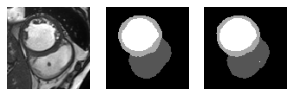

>>> 15:40:07, Epoch 278/1000, Loss: 0.027, Accuracy: nan, Validation Accuracy:  0.176


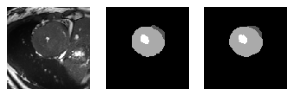

>>> 15:40:24, Epoch 279/1000, Loss: 0.027, Accuracy: nan, Validation Accuracy:  0.178


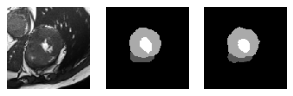

>>> 15:40:40, Epoch 280/1000, Loss: 0.027, Accuracy: 0.236, Validation Accuracy:  0.177


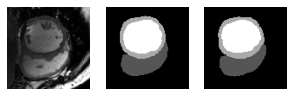

>>> 15:40:56, Epoch 281/1000, Loss: 0.027, Accuracy: 0.235, Validation Accuracy:  0.177


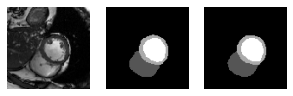

>>> 15:41:12, Epoch 282/1000, Loss: 0.027, Accuracy: 0.234, Validation Accuracy:  0.176


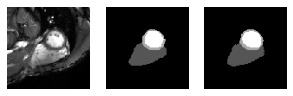

>>> 15:41:29, Epoch 283/1000, Loss: 0.027, Accuracy: 0.237, Validation Accuracy:  0.177


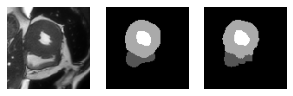

>>> 15:41:45, Epoch 284/1000, Loss: 0.027, Accuracy: nan, Validation Accuracy:  0.178


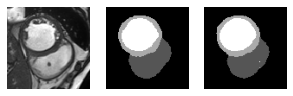

>>> 15:42:01, Epoch 285/1000, Loss: 0.027, Accuracy: nan, Validation Accuracy:  0.177


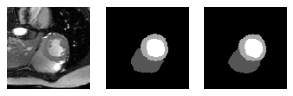

>>> 15:42:17, Epoch 286/1000, Loss: 0.027, Accuracy: nan, Validation Accuracy:  0.176


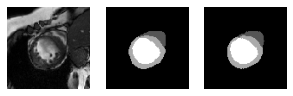

>>> 15:42:33, Epoch 287/1000, Loss: 0.027, Accuracy: 0.236, Validation Accuracy:  0.177


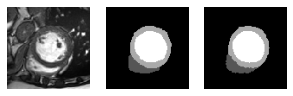

>>> 15:42:49, Epoch 288/1000, Loss: 0.026, Accuracy: nan, Validation Accuracy:  0.177


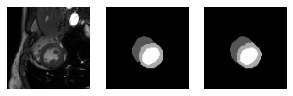

>>> 15:43:06, Epoch 289/1000, Loss: 0.027, Accuracy: 0.237, Validation Accuracy:  0.177


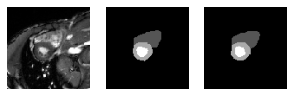

>>> 15:43:21, Epoch 290/1000, Loss: 0.026, Accuracy: nan, Validation Accuracy:  0.178


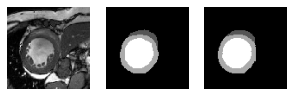

>>> 15:43:37, Epoch 291/1000, Loss: 0.027, Accuracy: 0.233, Validation Accuracy:  0.177


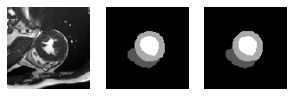

>>> 15:43:53, Epoch 292/1000, Loss: 0.026, Accuracy: 0.234, Validation Accuracy:  0.178


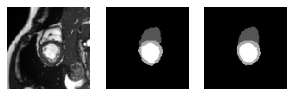

>>> 15:44:09, Epoch 293/1000, Loss: 0.026, Accuracy: 0.237, Validation Accuracy:  0.178


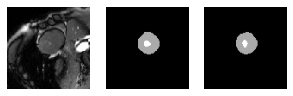

>>> 15:44:25, Epoch 294/1000, Loss: 0.026, Accuracy: 0.237, Validation Accuracy:  0.177


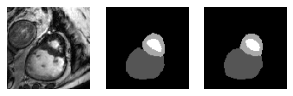

>>> 15:44:41, Epoch 295/1000, Loss: 0.026, Accuracy: nan, Validation Accuracy:  0.177


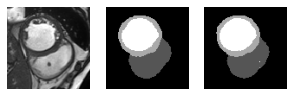

>>> 15:44:57, Epoch 296/1000, Loss: 0.026, Accuracy: nan, Validation Accuracy:  0.178


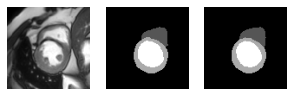

>>> 15:45:13, Epoch 297/1000, Loss: 0.026, Accuracy: nan, Validation Accuracy:  0.178


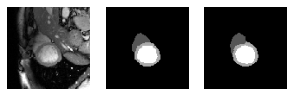

>>> 15:45:29, Epoch 298/1000, Loss: 0.026, Accuracy: nan, Validation Accuracy:  0.177


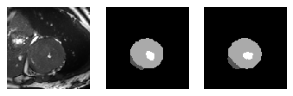

>>> 15:45:45, Epoch 299/1000, Loss: 0.026, Accuracy: 0.234, Validation Accuracy:  0.176


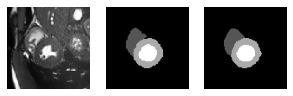

>>> 15:46:02, Epoch 300/1000, Loss: 0.026, Accuracy: 0.238, Validation Accuracy:  0.176


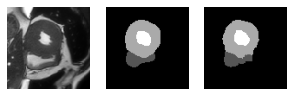

>>> 15:46:17, Epoch 301/1000, Loss: 0.026, Accuracy: 0.237, Validation Accuracy:  0.177


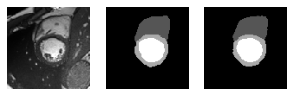

>>> 15:46:33, Epoch 302/1000, Loss: 0.026, Accuracy: 0.237, Validation Accuracy:  0.176


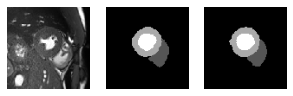

>>> 15:46:50, Epoch 303/1000, Loss: 0.026, Accuracy: 0.237, Validation Accuracy:  0.178


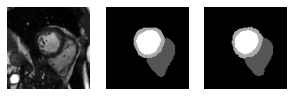

>>> 15:47:05, Epoch 304/1000, Loss: 0.026, Accuracy: 0.235, Validation Accuracy:  0.176


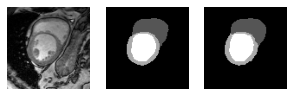

>>> 15:47:21, Epoch 305/1000, Loss: 0.026, Accuracy: nan, Validation Accuracy:  0.178


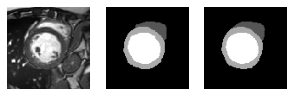

>>> 15:47:37, Epoch 306/1000, Loss: 0.025, Accuracy: 0.237, Validation Accuracy:  0.177


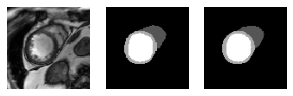

>>> 15:47:53, Epoch 307/1000, Loss: 0.025, Accuracy: 0.235, Validation Accuracy:  0.178


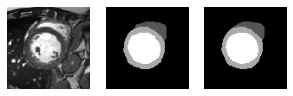

>>> 15:48:09, Epoch 308/1000, Loss: 0.025, Accuracy: 0.238, Validation Accuracy:  0.176


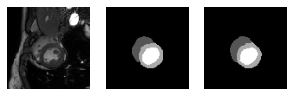

>>> 15:48:25, Epoch 309/1000, Loss: 0.025, Accuracy: 0.236, Validation Accuracy:  0.177


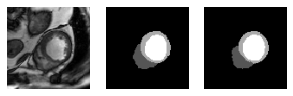

>>> 15:48:41, Epoch 310/1000, Loss: 0.025, Accuracy: 0.237, Validation Accuracy:  0.178


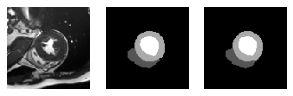

>>> 15:48:57, Epoch 311/1000, Loss: 0.025, Accuracy: 0.236, Validation Accuracy:  0.178


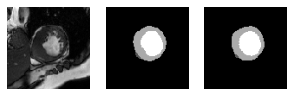

>>> 15:49:12, Epoch 312/1000, Loss: 0.025, Accuracy: 0.237, Validation Accuracy:  0.177


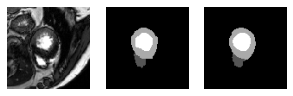

>>> 15:49:29, Epoch 313/1000, Loss: 0.025, Accuracy: 0.237, Validation Accuracy:  0.177


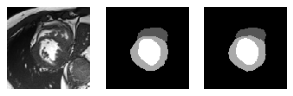

>>> 15:49:45, Epoch 314/1000, Loss: 0.025, Accuracy: nan, Validation Accuracy:  0.178


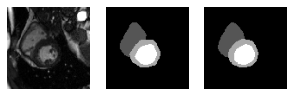

>>> 15:50:01, Epoch 315/1000, Loss: 0.025, Accuracy: nan, Validation Accuracy:  0.177


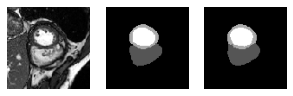

>>> 15:50:17, Epoch 316/1000, Loss: 0.025, Accuracy: 0.237, Validation Accuracy:  0.178


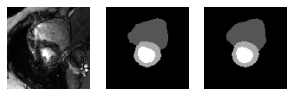

>>> 15:50:33, Epoch 317/1000, Loss: 0.025, Accuracy: 0.237, Validation Accuracy:  0.176


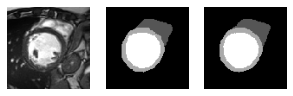

>>> 15:50:49, Epoch 318/1000, Loss: 0.025, Accuracy: nan, Validation Accuracy:  0.177


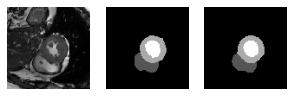

>>> 15:51:04, Epoch 319/1000, Loss: 0.025, Accuracy: nan, Validation Accuracy:  0.177


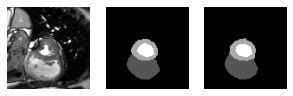

>>> 15:51:20, Epoch 320/1000, Loss: 0.025, Accuracy: 0.237, Validation Accuracy:  0.176


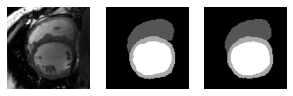

>>> 15:51:36, Epoch 321/1000, Loss: 0.025, Accuracy: 0.239, Validation Accuracy:  0.176


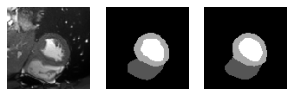

>>> 15:51:51, Epoch 322/1000, Loss: 0.025, Accuracy: nan, Validation Accuracy:  0.177


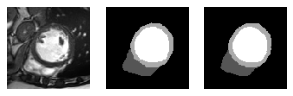

>>> 15:52:07, Epoch 323/1000, Loss: 0.025, Accuracy: 0.236, Validation Accuracy:  0.178


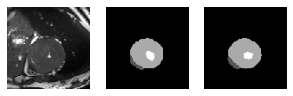

>>> 15:52:23, Epoch 324/1000, Loss: 0.024, Accuracy: 0.237, Validation Accuracy:  0.176


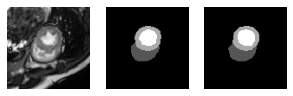

>>> 15:52:40, Epoch 325/1000, Loss: 0.025, Accuracy: nan, Validation Accuracy:  0.177


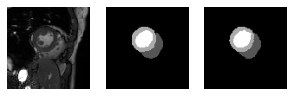

>>> 15:52:55, Epoch 326/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.177


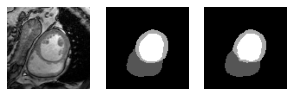

>>> 15:53:14, Epoch 327/1000, Loss: 0.024, Accuracy: nan, Validation Accuracy:  0.176


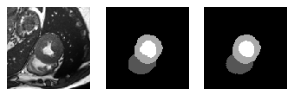

>>> 15:53:33, Epoch 328/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.178


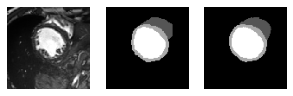

>>> 15:53:51, Epoch 329/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.177


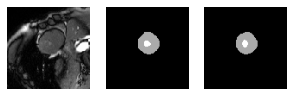

>>> 15:54:07, Epoch 330/1000, Loss: 0.024, Accuracy: 0.239, Validation Accuracy:  0.176


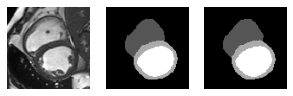

>>> 15:54:26, Epoch 331/1000, Loss: 0.024, Accuracy: nan, Validation Accuracy:  0.177


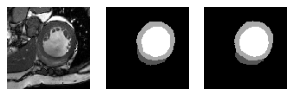

>>> 15:54:43, Epoch 332/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.177


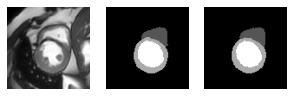

>>> 15:55:00, Epoch 333/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.178


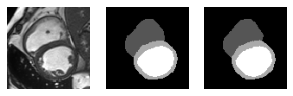

>>> 15:55:17, Epoch 334/1000, Loss: 0.024, Accuracy: 0.237, Validation Accuracy:  0.177


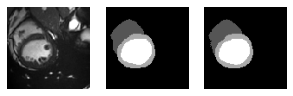

>>> 15:55:33, Epoch 335/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.176


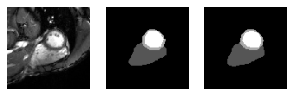

>>> 15:55:50, Epoch 336/1000, Loss: 0.024, Accuracy: 0.236, Validation Accuracy:  0.176


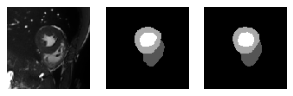

>>> 15:56:06, Epoch 337/1000, Loss: 0.024, Accuracy: 0.237, Validation Accuracy:  0.176


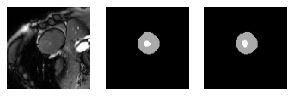

>>> 15:56:22, Epoch 338/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.177


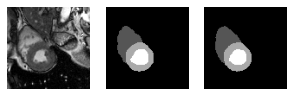

>>> 15:56:41, Epoch 339/1000, Loss: 0.024, Accuracy: nan, Validation Accuracy:  0.177


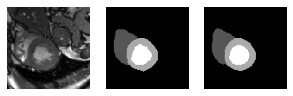

>>> 15:56:57, Epoch 340/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.176


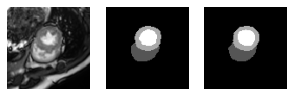

>>> 15:57:14, Epoch 341/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.178


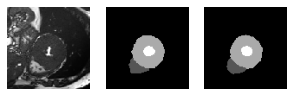

>>> 15:57:30, Epoch 342/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.178


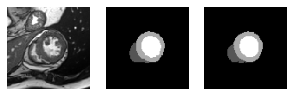

>>> 15:57:46, Epoch 343/1000, Loss: 0.024, Accuracy: 0.237, Validation Accuracy:  0.177


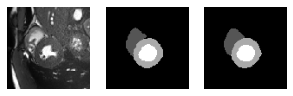

>>> 15:58:02, Epoch 344/1000, Loss: 0.024, Accuracy: nan, Validation Accuracy:  0.177


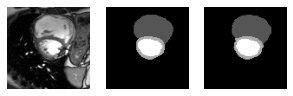

>>> 15:58:18, Epoch 345/1000, Loss: 0.023, Accuracy: 0.236, Validation Accuracy:  0.177


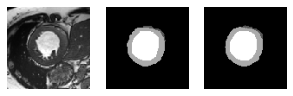

>>> 15:58:34, Epoch 346/1000, Loss: 0.024, Accuracy: 0.238, Validation Accuracy:  0.177


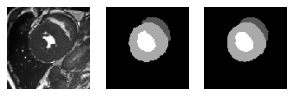

>>> 15:58:51, Epoch 347/1000, Loss: 0.023, Accuracy: 0.238, Validation Accuracy:  0.177


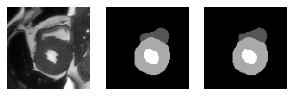

>>> 15:59:09, Epoch 348/1000, Loss: 0.023, Accuracy: 0.237, Validation Accuracy:  0.176


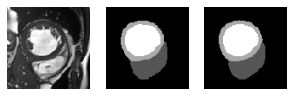

>>> 15:59:25, Epoch 349/1000, Loss: 0.023, Accuracy: 0.238, Validation Accuracy:  0.177


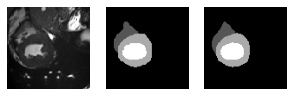

>>> 15:59:41, Epoch 350/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.177


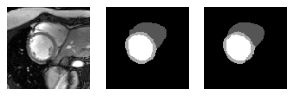

>>> 15:59:58, Epoch 351/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.177


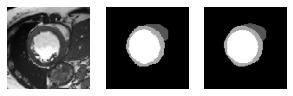

>>> 16:00:14, Epoch 352/1000, Loss: 0.023, Accuracy: 0.239, Validation Accuracy:  0.176


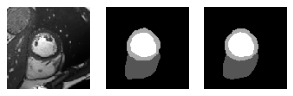

>>> 16:00:31, Epoch 353/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.177


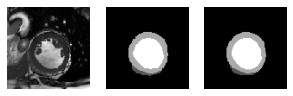

>>> 16:00:49, Epoch 354/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.176


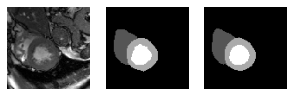

>>> 16:01:05, Epoch 355/1000, Loss: 0.023, Accuracy: 0.236, Validation Accuracy:  0.176


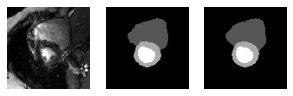

>>> 16:01:22, Epoch 356/1000, Loss: 0.023, Accuracy: 0.239, Validation Accuracy:  0.176


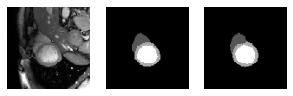

>>> 16:01:39, Epoch 357/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.177


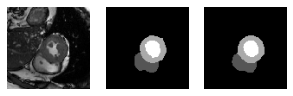

>>> 16:01:55, Epoch 358/1000, Loss: 0.023, Accuracy: 0.239, Validation Accuracy:  0.176


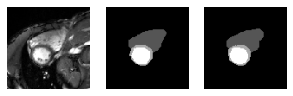

>>> 16:02:11, Epoch 359/1000, Loss: 0.023, Accuracy: 0.238, Validation Accuracy:  0.176


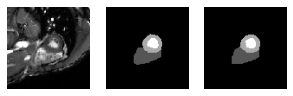

>>> 16:02:28, Epoch 360/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.177


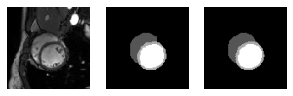

>>> 16:02:45, Epoch 361/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.177


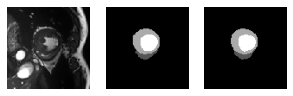

>>> 16:03:02, Epoch 362/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.176


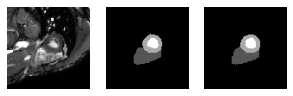

>>> 16:03:24, Epoch 363/1000, Loss: 0.023, Accuracy: 0.238, Validation Accuracy:  0.177


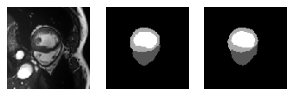

>>> 16:03:41, Epoch 364/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.175


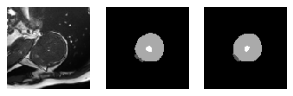

>>> 16:03:58, Epoch 365/1000, Loss: 0.023, Accuracy: 0.239, Validation Accuracy:  0.176


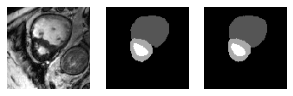

>>> 16:04:16, Epoch 366/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.177


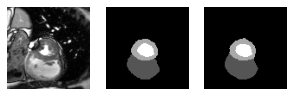

>>> 16:04:33, Epoch 367/1000, Loss: 0.023, Accuracy: 0.239, Validation Accuracy:  0.176


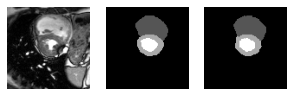

>>> 16:04:50, Epoch 368/1000, Loss: 0.023, Accuracy: nan, Validation Accuracy:  0.177


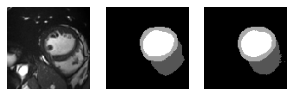

>>> 16:05:06, Epoch 369/1000, Loss: 0.022, Accuracy: 0.238, Validation Accuracy:  0.176


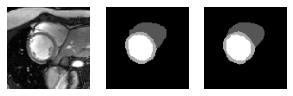

>>> 16:05:22, Epoch 370/1000, Loss: 0.022, Accuracy: nan, Validation Accuracy:  0.177


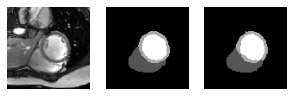

>>> 16:05:38, Epoch 371/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.177


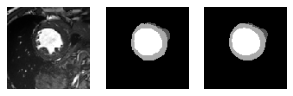

>>> 16:05:55, Epoch 372/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.175


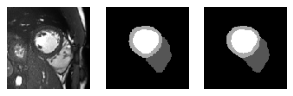

>>> 16:06:11, Epoch 373/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.176


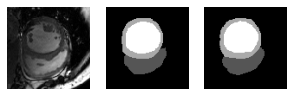

>>> 16:06:28, Epoch 374/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.177


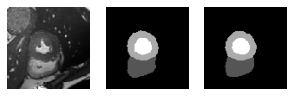

>>> 16:06:46, Epoch 375/1000, Loss: 0.022, Accuracy: 0.238, Validation Accuracy:  0.176


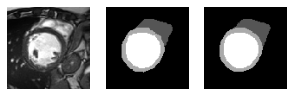

>>> 16:07:02, Epoch 376/1000, Loss: 0.022, Accuracy: nan, Validation Accuracy:  0.177


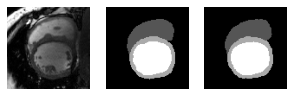

>>> 16:07:19, Epoch 377/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.177


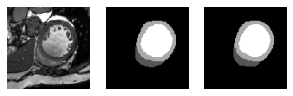

>>> 16:07:36, Epoch 378/1000, Loss: 0.022, Accuracy: 0.238, Validation Accuracy:  0.175


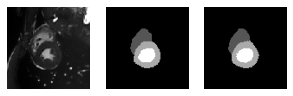

>>> 16:07:52, Epoch 379/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.176


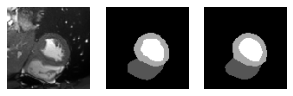

>>> 16:08:08, Epoch 380/1000, Loss: 0.022, Accuracy: 0.238, Validation Accuracy:  0.177


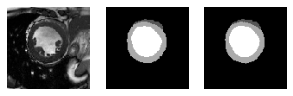

>>> 16:08:25, Epoch 381/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.178


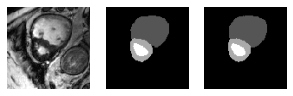

>>> 16:08:41, Epoch 382/1000, Loss: 0.022, Accuracy: nan, Validation Accuracy:  0.176


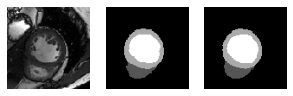

>>> 16:08:58, Epoch 383/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.175


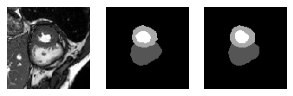

>>> 16:09:14, Epoch 384/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.177


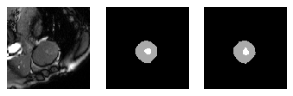

>>> 16:09:30, Epoch 385/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.176


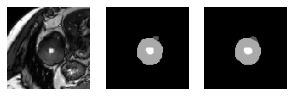

>>> 16:09:47, Epoch 386/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.176


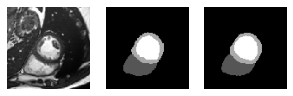

>>> 16:10:04, Epoch 387/1000, Loss: 0.022, Accuracy: nan, Validation Accuracy:  0.177


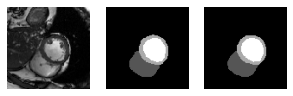

>>> 16:10:22, Epoch 388/1000, Loss: 0.022, Accuracy: nan, Validation Accuracy:  0.177


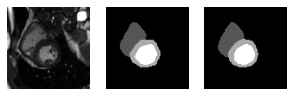

>>> 16:10:39, Epoch 389/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.176


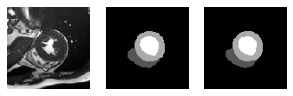

>>> 16:10:56, Epoch 390/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.176


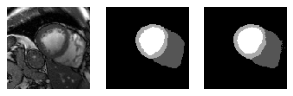

>>> 16:11:14, Epoch 391/1000, Loss: 0.022, Accuracy: nan, Validation Accuracy:  0.176


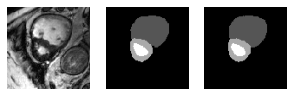

>>> 16:11:31, Epoch 392/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.176


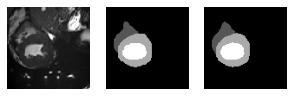

>>> 16:11:47, Epoch 393/1000, Loss: 0.022, Accuracy: nan, Validation Accuracy:  0.177


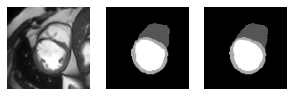

>>> 16:12:03, Epoch 394/1000, Loss: 0.022, Accuracy: 0.240, Validation Accuracy:  0.176


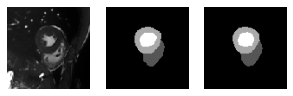

>>> 16:12:20, Epoch 395/1000, Loss: 0.022, Accuracy: 0.239, Validation Accuracy:  0.176


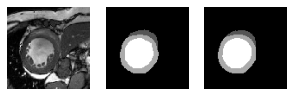

>>> 16:12:39, Epoch 396/1000, Loss: 0.022, Accuracy: 0.240, Validation Accuracy:  0.177


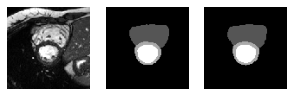

>>> 16:12:55, Epoch 397/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.175


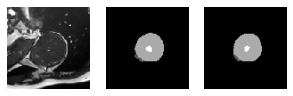

>>> 16:13:11, Epoch 398/1000, Loss: 0.022, Accuracy: nan, Validation Accuracy:  0.177


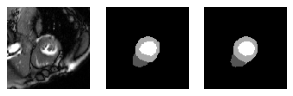

>>> 16:13:27, Epoch 399/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.176


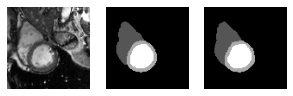

>>> 16:13:43, Epoch 400/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.177


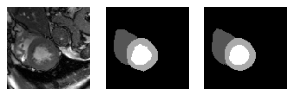

>>> 16:13:58, Epoch 401/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.176


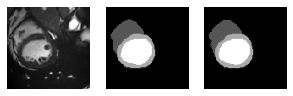

>>> 16:14:14, Epoch 402/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.177


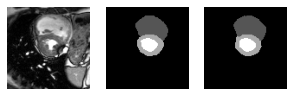

>>> 16:14:30, Epoch 403/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.177


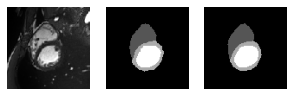

>>> 16:14:47, Epoch 404/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.176


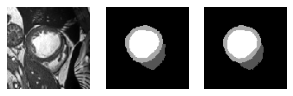

>>> 16:15:03, Epoch 405/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.176


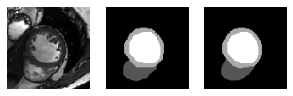

>>> 16:15:19, Epoch 406/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.177


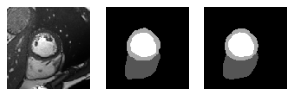

>>> 16:15:35, Epoch 407/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.176


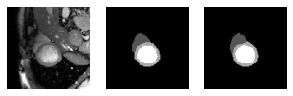

>>> 16:15:52, Epoch 408/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.177


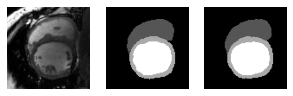

>>> 16:16:08, Epoch 409/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.175


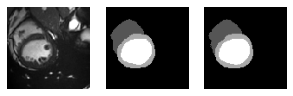

>>> 16:16:24, Epoch 410/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.175


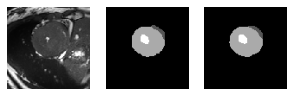

>>> 16:16:41, Epoch 411/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.176


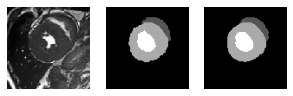

>>> 16:16:57, Epoch 412/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.176


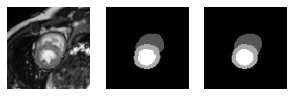

>>> 16:17:13, Epoch 413/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.176


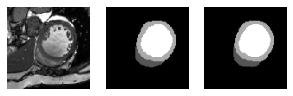

>>> 16:17:29, Epoch 414/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.178


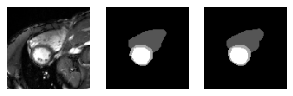

>>> 16:17:45, Epoch 415/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.177


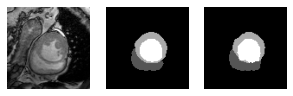

>>> 16:18:01, Epoch 416/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.177


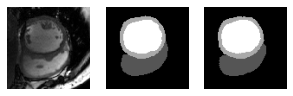

>>> 16:18:18, Epoch 417/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.177


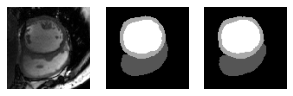

>>> 16:18:34, Epoch 418/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.177


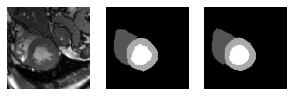

>>> 16:18:51, Epoch 419/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.176


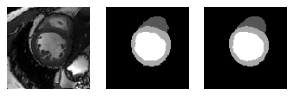

>>> 16:19:09, Epoch 420/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.176


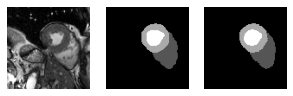

>>> 16:19:26, Epoch 421/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.176


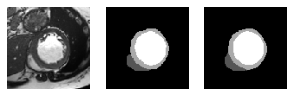

>>> 16:19:43, Epoch 422/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.176


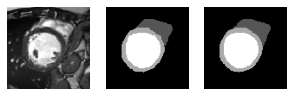

>>> 16:20:01, Epoch 423/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.175


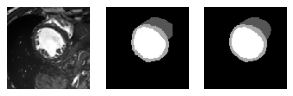

>>> 16:20:17, Epoch 424/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.176


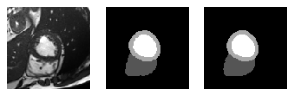

>>> 16:20:34, Epoch 425/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.176


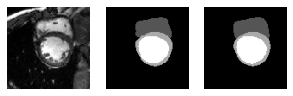

>>> 16:20:50, Epoch 426/1000, Loss: 0.021, Accuracy: 0.239, Validation Accuracy:  0.175


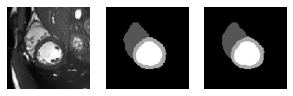

>>> 16:21:06, Epoch 427/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.177


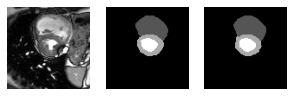

>>> 16:21:22, Epoch 428/1000, Loss: 0.021, Accuracy: 0.240, Validation Accuracy:  0.176


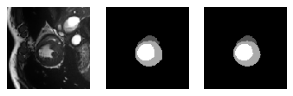

>>> 16:21:38, Epoch 429/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.176


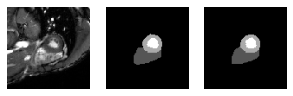

>>> 16:21:55, Epoch 430/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.177


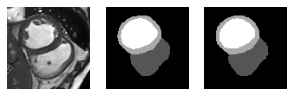

>>> 16:22:12, Epoch 431/1000, Loss: 0.021, Accuracy: nan, Validation Accuracy:  0.177


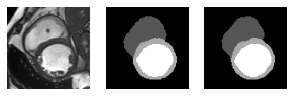

>>> 16:22:29, Epoch 432/1000, Loss: 0.020, Accuracy: 0.241, Validation Accuracy:  0.177


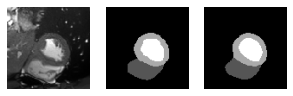

>>> 16:22:46, Epoch 433/1000, Loss: 0.020, Accuracy: 0.241, Validation Accuracy:  0.177


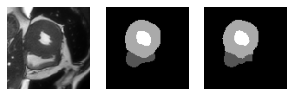

>>> 16:23:04, Epoch 434/1000, Loss: 0.020, Accuracy: 0.239, Validation Accuracy:  0.177


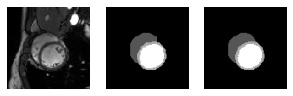

>>> 16:23:21, Epoch 435/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.176


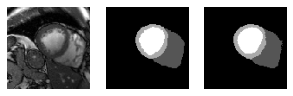

>>> 16:23:36, Epoch 436/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.177


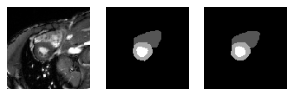

>>> 16:23:53, Epoch 437/1000, Loss: 0.020, Accuracy: 0.239, Validation Accuracy:  0.176


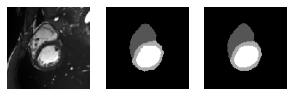

>>> 16:24:10, Epoch 438/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.177


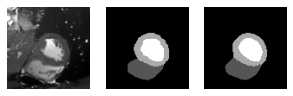

>>> 16:24:26, Epoch 439/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.177


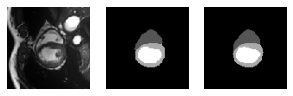

>>> 16:24:44, Epoch 440/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.178


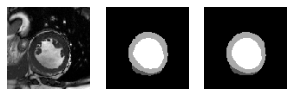

>>> 16:25:01, Epoch 441/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.176


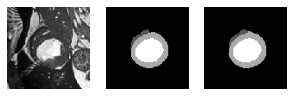

>>> 16:25:19, Epoch 442/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.176


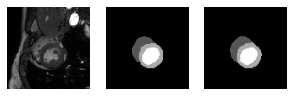

>>> 16:25:36, Epoch 443/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.177


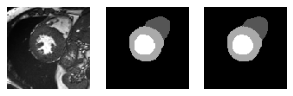

>>> 16:25:52, Epoch 444/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.177


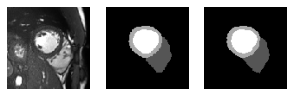

>>> 16:26:08, Epoch 445/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.176


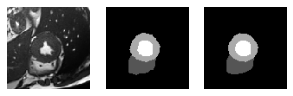

>>> 16:26:25, Epoch 446/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.176


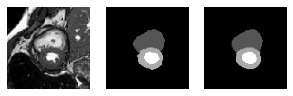

>>> 16:26:43, Epoch 447/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.177


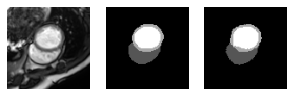

>>> 16:26:59, Epoch 448/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.176


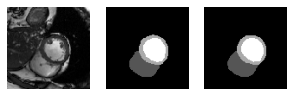

>>> 16:27:16, Epoch 449/1000, Loss: 0.020, Accuracy: 0.241, Validation Accuracy:  0.176


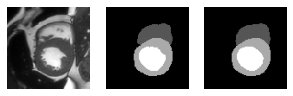

>>> 16:27:32, Epoch 450/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.177


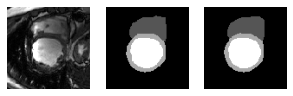

>>> 16:27:48, Epoch 451/1000, Loss: 0.020, Accuracy: 0.241, Validation Accuracy:  0.178


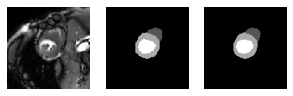

>>> 16:28:04, Epoch 452/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.177


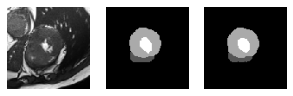

>>> 16:28:19, Epoch 453/1000, Loss: 0.020, Accuracy: 0.241, Validation Accuracy:  0.177


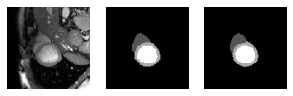

>>> 16:28:35, Epoch 454/1000, Loss: 0.020, Accuracy: 0.241, Validation Accuracy:  0.177


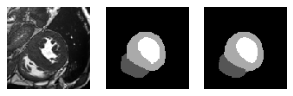

>>> 16:28:51, Epoch 455/1000, Loss: 0.020, Accuracy: 0.241, Validation Accuracy:  0.177


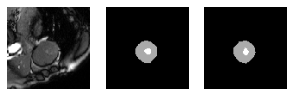

>>> 16:29:06, Epoch 456/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.176


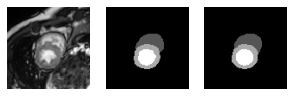

>>> 16:29:22, Epoch 457/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.176


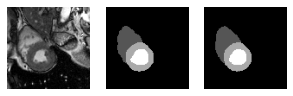

>>> 16:29:37, Epoch 458/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.176


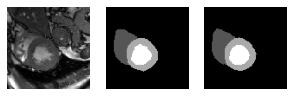

>>> 16:29:53, Epoch 459/1000, Loss: 0.020, Accuracy: 0.241, Validation Accuracy:  0.176


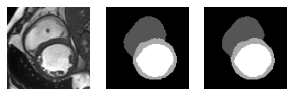

>>> 16:30:09, Epoch 460/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.177


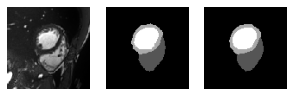

>>> 16:30:24, Epoch 461/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.177


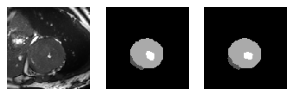

>>> 16:30:40, Epoch 462/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.176


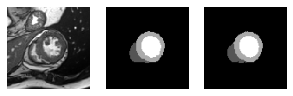

>>> 16:30:56, Epoch 463/1000, Loss: 0.020, Accuracy: nan, Validation Accuracy:  0.176


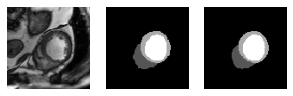

>>> 16:31:12, Epoch 464/1000, Loss: 0.020, Accuracy: 0.240, Validation Accuracy:  0.176


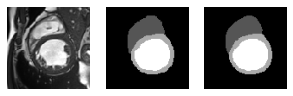

>>> 16:31:28, Epoch 465/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.176


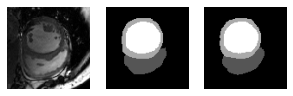

>>> 16:31:45, Epoch 466/1000, Loss: 0.019, Accuracy: 0.240, Validation Accuracy:  0.176


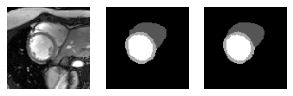

>>> 16:32:01, Epoch 467/1000, Loss: 0.020, Accuracy: 0.239, Validation Accuracy:  0.176


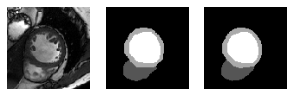

>>> 16:32:17, Epoch 468/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


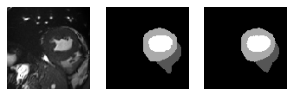

>>> 16:32:34, Epoch 469/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.177


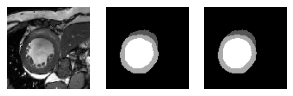

>>> 16:32:50, Epoch 470/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.177


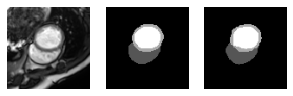

>>> 16:33:06, Epoch 471/1000, Loss: 0.019, Accuracy: 0.240, Validation Accuracy:  0.176


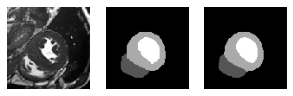

>>> 16:33:22, Epoch 472/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.177


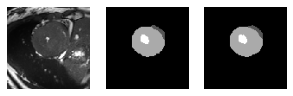

>>> 16:33:38, Epoch 473/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.177


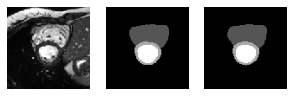

>>> 16:33:54, Epoch 474/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.177


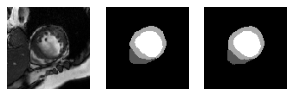

>>> 16:34:09, Epoch 475/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.177


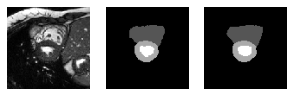

>>> 16:34:26, Epoch 476/1000, Loss: 0.019, Accuracy: 0.240, Validation Accuracy:  0.176


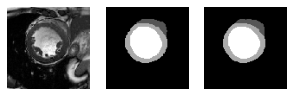

>>> 16:34:42, Epoch 477/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.177


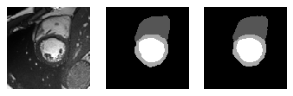

>>> 16:34:58, Epoch 478/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


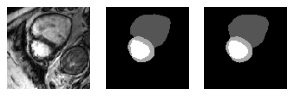

>>> 16:35:14, Epoch 479/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


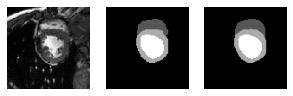

>>> 16:35:31, Epoch 480/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


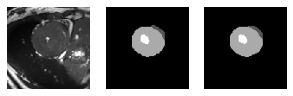

>>> 16:35:47, Epoch 481/1000, Loss: 0.019, Accuracy: 0.240, Validation Accuracy:  0.176


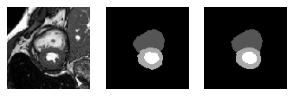

>>> 16:36:04, Epoch 482/1000, Loss: 0.019, Accuracy: 0.240, Validation Accuracy:  0.176


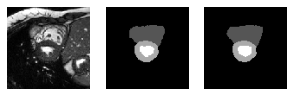

>>> 16:36:21, Epoch 483/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.176


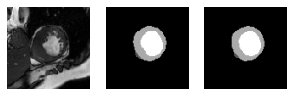

>>> 16:36:38, Epoch 484/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


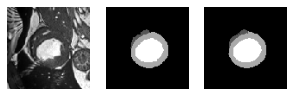

>>> 16:36:55, Epoch 485/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


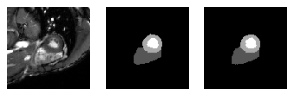

>>> 16:37:12, Epoch 486/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


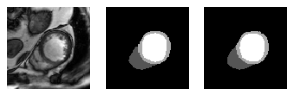

>>> 16:37:28, Epoch 487/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.176


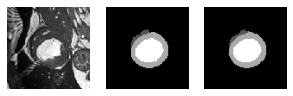

>>> 16:37:44, Epoch 488/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


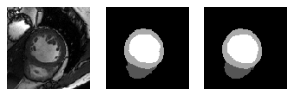

>>> 16:38:00, Epoch 489/1000, Loss: 0.019, Accuracy: 0.240, Validation Accuracy:  0.176


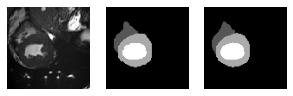

>>> 16:38:16, Epoch 490/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.176


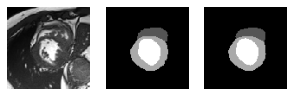

>>> 16:38:31, Epoch 491/1000, Loss: 0.019, Accuracy: 0.240, Validation Accuracy:  0.177


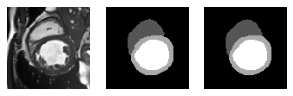

>>> 16:38:48, Epoch 492/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


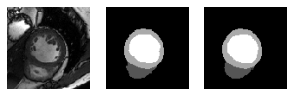

>>> 16:39:04, Epoch 493/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.177


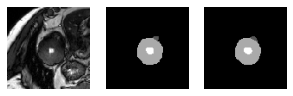

>>> 16:39:21, Epoch 494/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.177


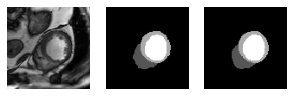

>>> 16:39:38, Epoch 495/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.177


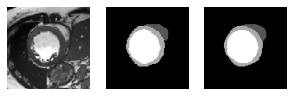

>>> 16:39:53, Epoch 496/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.176


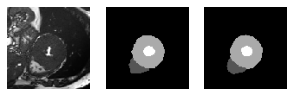

>>> 16:40:10, Epoch 497/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.176


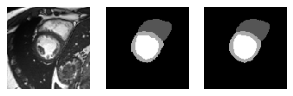

>>> 16:40:26, Epoch 498/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.176


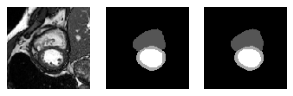

>>> 16:40:42, Epoch 499/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.177


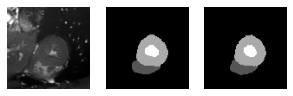

>>> 16:40:57, Epoch 500/1000, Loss: 0.019, Accuracy: 0.241, Validation Accuracy:  0.176


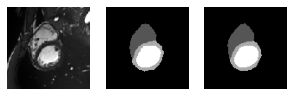

>>> 16:41:12, Epoch 501/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


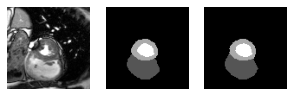

>>> 16:41:28, Epoch 502/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


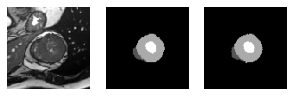

>>> 16:41:44, Epoch 503/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


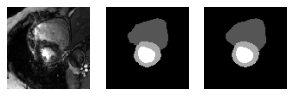

>>> 16:42:00, Epoch 504/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


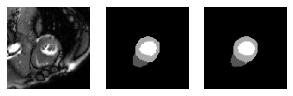

>>> 16:42:15, Epoch 505/1000, Loss: 0.019, Accuracy: 0.240, Validation Accuracy:  0.177


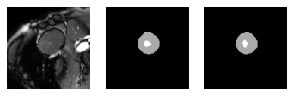

>>> 16:42:31, Epoch 506/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


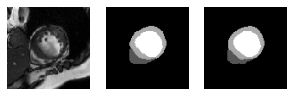

>>> 16:42:47, Epoch 507/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


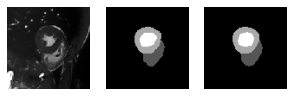

>>> 16:43:03, Epoch 508/1000, Loss: 0.019, Accuracy: nan, Validation Accuracy:  0.176


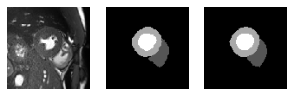

>>> 16:43:18, Epoch 509/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.177


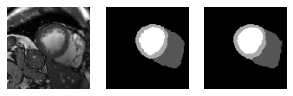

>>> 16:43:34, Epoch 510/1000, Loss: 0.019, Accuracy: 0.240, Validation Accuracy:  0.177


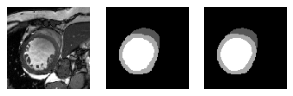

>>> 16:43:49, Epoch 511/1000, Loss: 0.018, Accuracy: 0.240, Validation Accuracy:  0.176


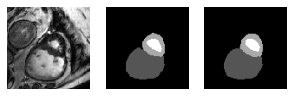

>>> 16:44:05, Epoch 512/1000, Loss: 0.018, Accuracy: 0.240, Validation Accuracy:  0.176


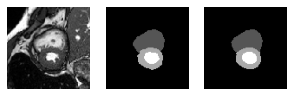

>>> 16:44:21, Epoch 513/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.177


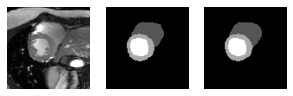

>>> 16:44:36, Epoch 514/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.177


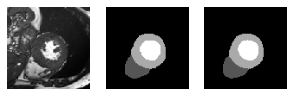

>>> 16:44:52, Epoch 515/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


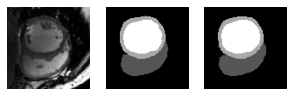

>>> 16:45:08, Epoch 516/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


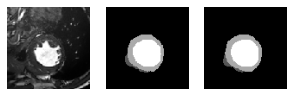

>>> 16:45:23, Epoch 517/1000, Loss: 0.018, Accuracy: 0.240, Validation Accuracy:  0.176


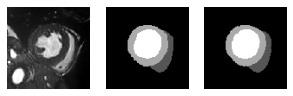

>>> 16:45:39, Epoch 518/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


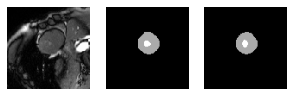

>>> 16:45:55, Epoch 519/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.177


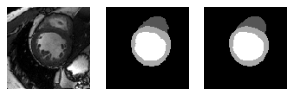

>>> 16:46:11, Epoch 520/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


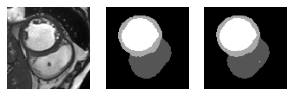

>>> 16:46:26, Epoch 521/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


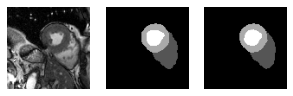

>>> 16:46:43, Epoch 522/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


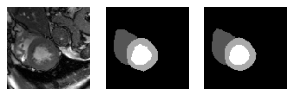

>>> 16:46:58, Epoch 523/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


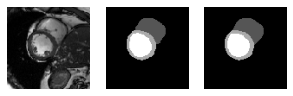

>>> 16:47:14, Epoch 524/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


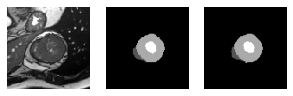

>>> 16:47:29, Epoch 525/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


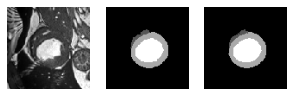

>>> 16:47:45, Epoch 526/1000, Loss: 0.018, Accuracy: 0.242, Validation Accuracy:  0.176


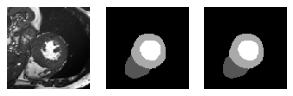

>>> 16:48:00, Epoch 527/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


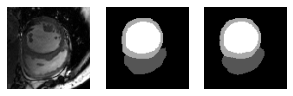

>>> 16:48:16, Epoch 528/1000, Loss: 0.018, Accuracy: 0.240, Validation Accuracy:  0.176


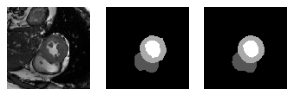

>>> 16:48:31, Epoch 529/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


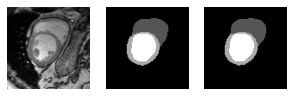

>>> 16:48:47, Epoch 530/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


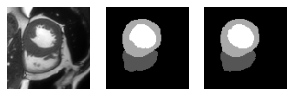

>>> 16:49:03, Epoch 531/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


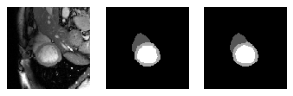

>>> 16:49:19, Epoch 532/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


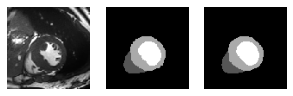

>>> 16:49:34, Epoch 533/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.177


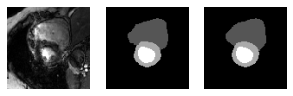

>>> 16:49:50, Epoch 534/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.177


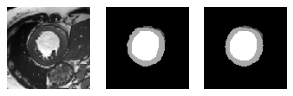

>>> 16:50:06, Epoch 535/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


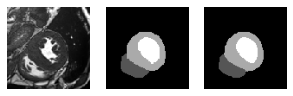

>>> 16:50:21, Epoch 536/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


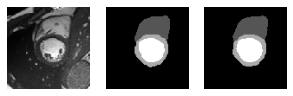

>>> 16:50:37, Epoch 537/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.177


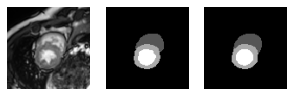

>>> 16:50:53, Epoch 538/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


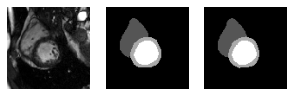

>>> 16:51:08, Epoch 539/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


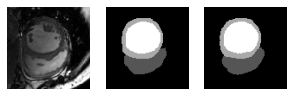

>>> 16:51:24, Epoch 540/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.177


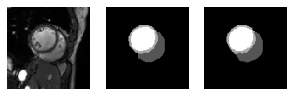

>>> 16:51:40, Epoch 541/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.177


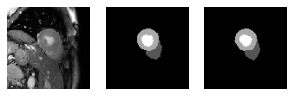

>>> 16:51:56, Epoch 542/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


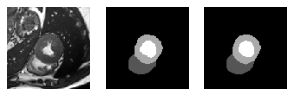

>>> 16:52:11, Epoch 543/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


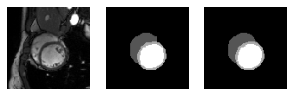

>>> 16:52:26, Epoch 544/1000, Loss: 0.018, Accuracy: 0.240, Validation Accuracy:  0.176


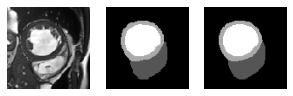

>>> 16:52:42, Epoch 545/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


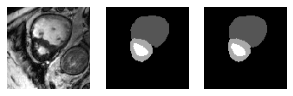

>>> 16:52:57, Epoch 546/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


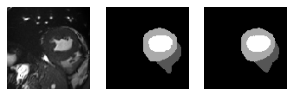

>>> 16:53:13, Epoch 547/1000, Loss: 0.018, Accuracy: 0.240, Validation Accuracy:  0.176


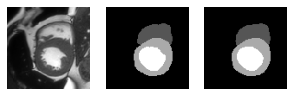

>>> 16:53:28, Epoch 548/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


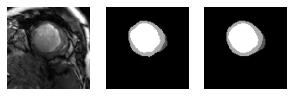

>>> 16:53:44, Epoch 549/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


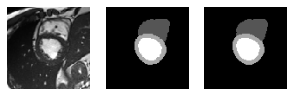

>>> 16:53:59, Epoch 550/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


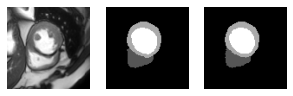

>>> 16:54:15, Epoch 551/1000, Loss: 0.018, Accuracy: 0.242, Validation Accuracy:  0.176


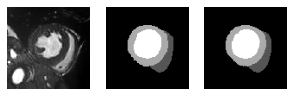

>>> 16:54:30, Epoch 552/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.177


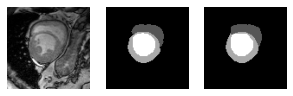

>>> 16:54:47, Epoch 553/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


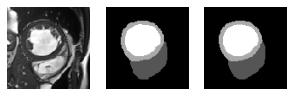

>>> 16:55:02, Epoch 554/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


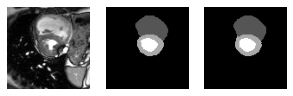

>>> 16:55:18, Epoch 555/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


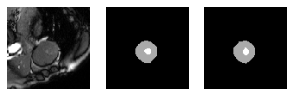

>>> 16:55:33, Epoch 556/1000, Loss: 0.018, Accuracy: 0.242, Validation Accuracy:  0.176


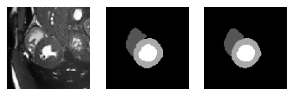

>>> 16:55:49, Epoch 557/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


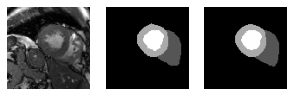

>>> 16:56:04, Epoch 558/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


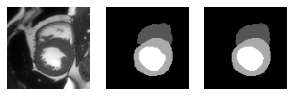

>>> 16:56:20, Epoch 559/1000, Loss: 0.018, Accuracy: 0.241, Validation Accuracy:  0.176


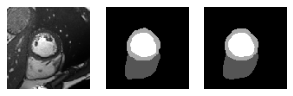

>>> 16:56:35, Epoch 560/1000, Loss: 0.018, Accuracy: 0.242, Validation Accuracy:  0.177


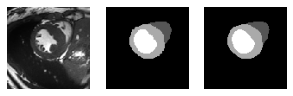

>>> 16:56:51, Epoch 561/1000, Loss: 0.018, Accuracy: nan, Validation Accuracy:  0.176


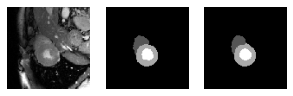

>>> 16:57:12, Epoch 562/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.176


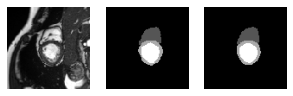

>>> 16:57:34, Epoch 563/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


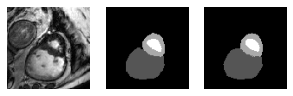

>>> 16:58:06, Epoch 564/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


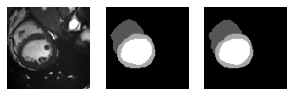

>>> 16:58:23, Epoch 565/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.176


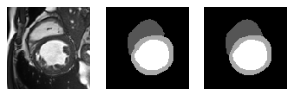

>>> 16:58:39, Epoch 566/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


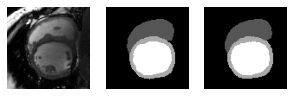

>>> 16:58:55, Epoch 567/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


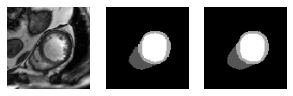

>>> 16:59:12, Epoch 568/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.175


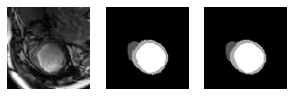

>>> 16:59:29, Epoch 569/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


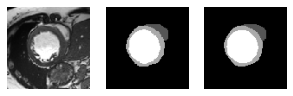

>>> 16:59:45, Epoch 570/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.176


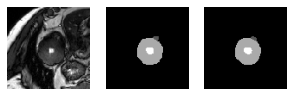

>>> 17:00:01, Epoch 571/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.176


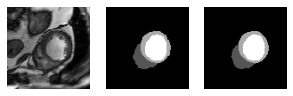

>>> 17:00:18, Epoch 572/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.177


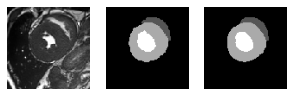

>>> 17:00:34, Epoch 573/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


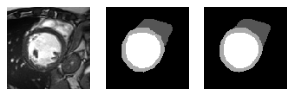

>>> 17:00:51, Epoch 574/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


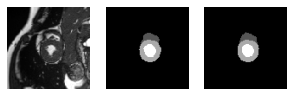

>>> 17:01:07, Epoch 575/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.176


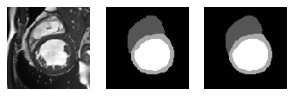

>>> 17:01:23, Epoch 576/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


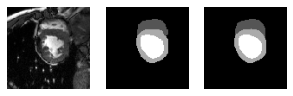

>>> 17:01:39, Epoch 577/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.177


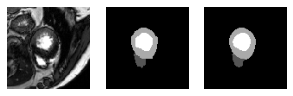

>>> 17:01:56, Epoch 578/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


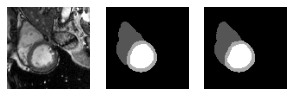

>>> 17:02:18, Epoch 579/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


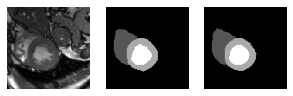

>>> 17:02:40, Epoch 580/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


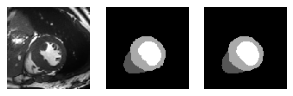

>>> 17:02:59, Epoch 581/1000, Loss: 0.017, Accuracy: 0.240, Validation Accuracy:  0.176


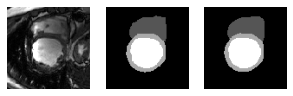

>>> 17:03:15, Epoch 582/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


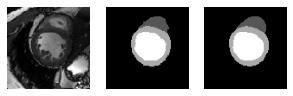

>>> 17:03:34, Epoch 583/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


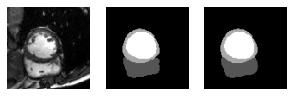

>>> 17:03:50, Epoch 584/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


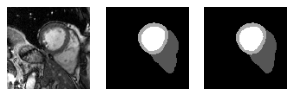

>>> 17:04:07, Epoch 585/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


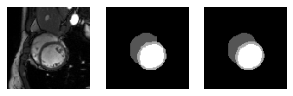

>>> 17:04:23, Epoch 586/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


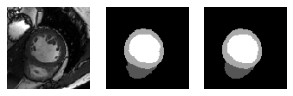

>>> 17:04:40, Epoch 587/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


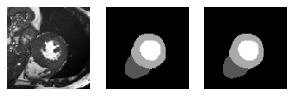

>>> 17:04:56, Epoch 588/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


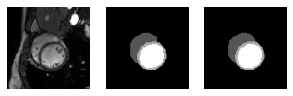

>>> 17:05:12, Epoch 589/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.176


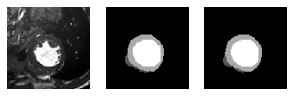

>>> 17:05:28, Epoch 590/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.177


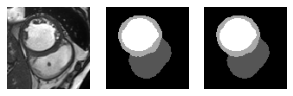

>>> 17:05:44, Epoch 591/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


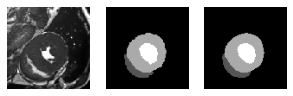

>>> 17:06:00, Epoch 592/1000, Loss: 0.017, Accuracy: 0.243, Validation Accuracy:  0.176


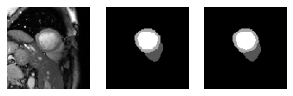

>>> 17:06:16, Epoch 593/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


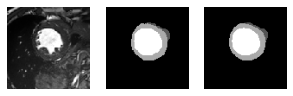

>>> 17:06:47, Epoch 594/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


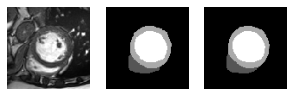

>>> 17:07:04, Epoch 595/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.176


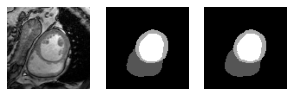

>>> 17:07:22, Epoch 596/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


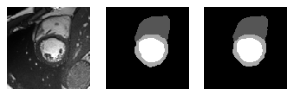

>>> 17:07:40, Epoch 597/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.176


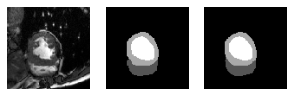

>>> 17:07:59, Epoch 598/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.176


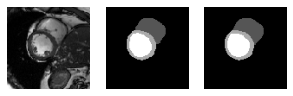

>>> 17:08:16, Epoch 599/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.177


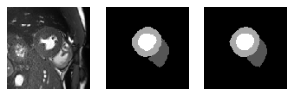

>>> 17:08:40, Epoch 600/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


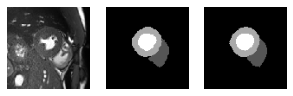

>>> 17:09:01, Epoch 601/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.177


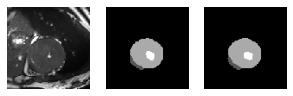

>>> 17:09:17, Epoch 602/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


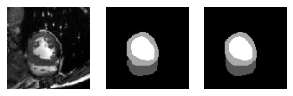

>>> 17:09:37, Epoch 603/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


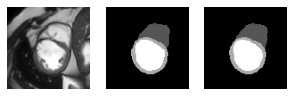

>>> 17:09:54, Epoch 604/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.175


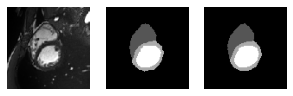

>>> 17:10:10, Epoch 605/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


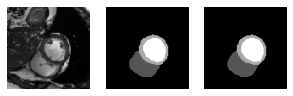

>>> 17:10:26, Epoch 606/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


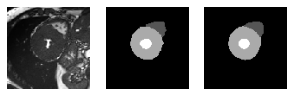

>>> 17:10:43, Epoch 607/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


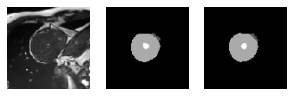

>>> 17:11:00, Epoch 608/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


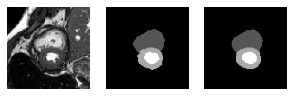

>>> 17:11:16, Epoch 609/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.177


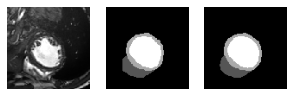

>>> 17:11:36, Epoch 610/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


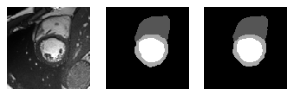

>>> 17:12:03, Epoch 611/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.177


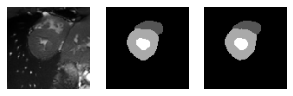

>>> 17:12:19, Epoch 612/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


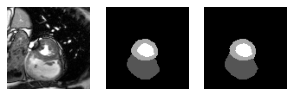

>>> 17:12:36, Epoch 613/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


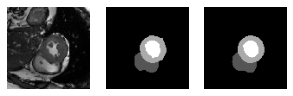

>>> 17:12:54, Epoch 614/1000, Loss: 0.017, Accuracy: 0.241, Validation Accuracy:  0.177


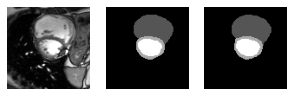

>>> 17:13:11, Epoch 615/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


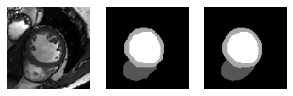

>>> 17:13:28, Epoch 616/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


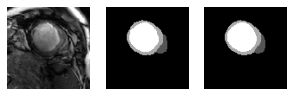

>>> 17:13:44, Epoch 617/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


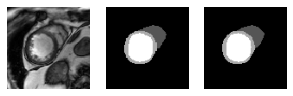

>>> 17:14:00, Epoch 618/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


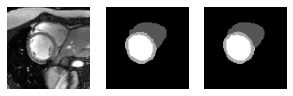

>>> 17:14:17, Epoch 619/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.175


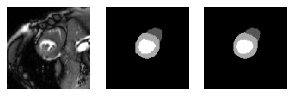

>>> 17:14:33, Epoch 620/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


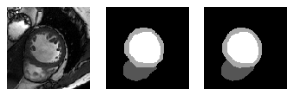

>>> 17:14:50, Epoch 621/1000, Loss: 0.017, Accuracy: 0.242, Validation Accuracy:  0.176


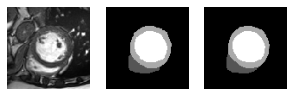

>>> 17:15:06, Epoch 622/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


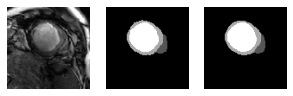

>>> 17:15:23, Epoch 623/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


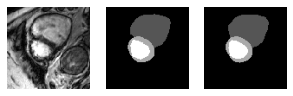

>>> 17:15:39, Epoch 624/1000, Loss: 0.017, Accuracy: nan, Validation Accuracy:  0.176


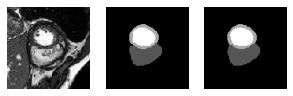

>>> 17:15:56, Epoch 625/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


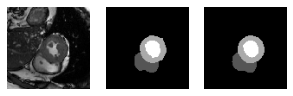

>>> 17:16:13, Epoch 626/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


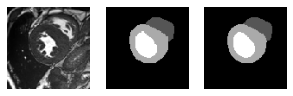

>>> 17:16:31, Epoch 627/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


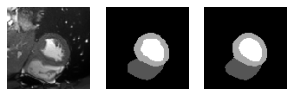

>>> 17:16:54, Epoch 628/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


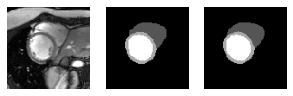

>>> 17:17:11, Epoch 629/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


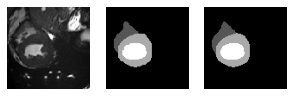

>>> 17:17:27, Epoch 630/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


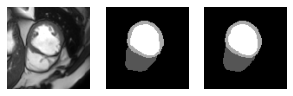

>>> 17:17:42, Epoch 631/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


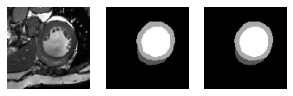

>>> 17:17:58, Epoch 632/1000, Loss: 0.016, Accuracy: 0.241, Validation Accuracy:  0.176


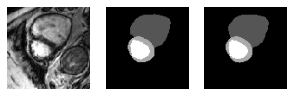

>>> 17:18:14, Epoch 633/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


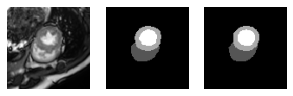

>>> 17:18:29, Epoch 634/1000, Loss: 0.016, Accuracy: 0.241, Validation Accuracy:  0.176


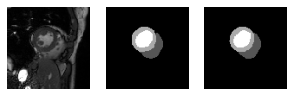

>>> 17:18:45, Epoch 635/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.177


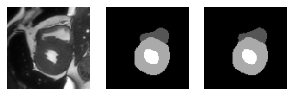

>>> 17:19:01, Epoch 636/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


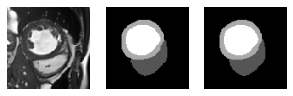

>>> 17:19:16, Epoch 637/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


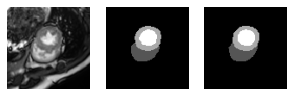

>>> 17:19:32, Epoch 638/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.175


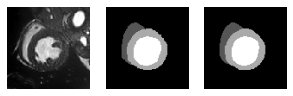

>>> 17:19:48, Epoch 639/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


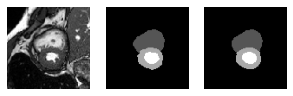

>>> 17:20:04, Epoch 640/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.177


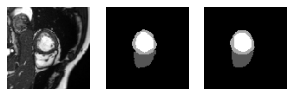

>>> 17:20:20, Epoch 641/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


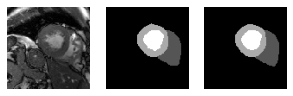

>>> 17:20:35, Epoch 642/1000, Loss: 0.016, Accuracy: 0.243, Validation Accuracy:  0.175


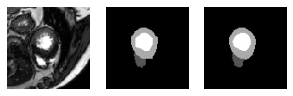

>>> 17:20:51, Epoch 643/1000, Loss: 0.016, Accuracy: 0.241, Validation Accuracy:  0.176


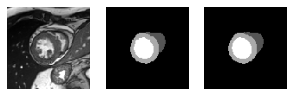

>>> 17:21:07, Epoch 644/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


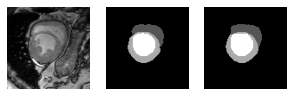

>>> 17:21:22, Epoch 645/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.175


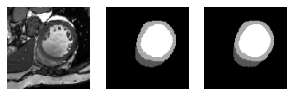

>>> 17:21:38, Epoch 646/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


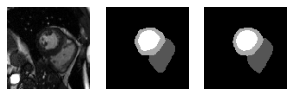

>>> 17:21:55, Epoch 647/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


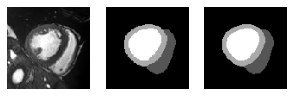

>>> 17:22:10, Epoch 648/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


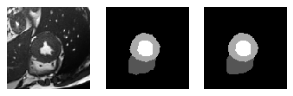

>>> 17:22:26, Epoch 649/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


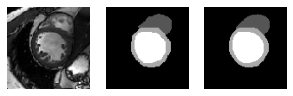

>>> 17:22:42, Epoch 650/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


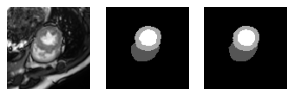

>>> 17:22:57, Epoch 651/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


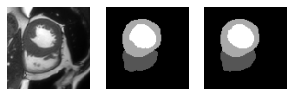

>>> 17:23:13, Epoch 652/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


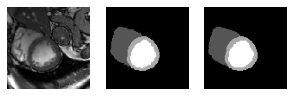

>>> 17:23:29, Epoch 653/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


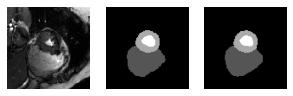

>>> 17:23:44, Epoch 654/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


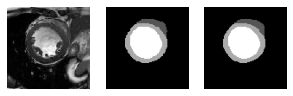

>>> 17:24:00, Epoch 655/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


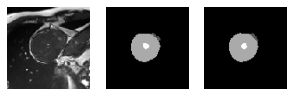

>>> 17:24:15, Epoch 656/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


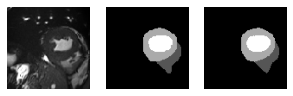

>>> 17:24:32, Epoch 657/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


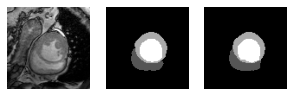

>>> 17:24:47, Epoch 658/1000, Loss: 0.016, Accuracy: 0.243, Validation Accuracy:  0.176


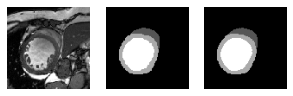

>>> 17:25:03, Epoch 659/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


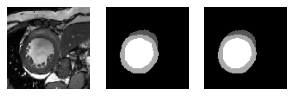

>>> 17:25:18, Epoch 660/1000, Loss: 0.016, Accuracy: 0.241, Validation Accuracy:  0.175


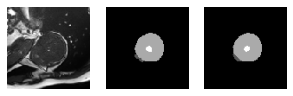

>>> 17:25:34, Epoch 661/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.176


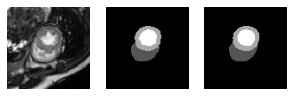

>>> 17:25:50, Epoch 662/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


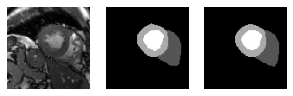

>>> 17:26:05, Epoch 663/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


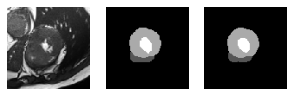

>>> 17:26:27, Epoch 664/1000, Loss: 0.016, Accuracy: nan, Validation Accuracy:  0.175


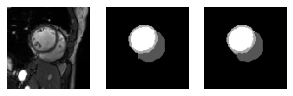

>>> 17:26:46, Epoch 665/1000, Loss: 0.016, Accuracy: 0.242, Validation Accuracy:  0.176


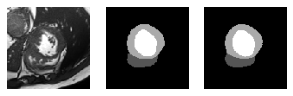

In [ ]:
data_path = './data/train'
batch_size = 10
train_set = TrainDataset(data_path)
training_data_loader = DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)
num_epochs = 1000

if len(train_set) % batch_size > 0:
    raise Exception("Incorrect batch size. It has to take into account length of the train dataset.")
    
for epoch in range(num_epochs):
    running_loss = 0.0
    batch_accuracy = 0
    for iteration, sample in enumerate(training_data_loader):
        img, mask = sample
        
        #Augmenting batch of images
        img_transformed, mask_transformed = [], []
        for one_img, one_mask in zip(img, mask):
            im, msk = perform_random_transformation(p_np_img=one_img.int(), p_np_mask=one_mask.int())
            img_transformed.append(copy.deepcopy(im))
            mask_transformed.append(copy.deepcopy(msk))
            
        img_augmented = torch.from_numpy(np.array(img_transformed)).float()
        mask_augmented = torch.from_numpy(np.array(mask_transformed)).float()
    
        optimizer.zero_grad()
        outputs = model(img_augmented.reshape(batch_size, -1, 96, 96))
        
        loss = loss_fn(outputs, mask_augmented.long())
        loss.backward()
        optimizer.step()   
        scheduler.step()   
        
        running_loss += loss.item()
        batch_accuracy += multiclass_categorical_dice(p_tensor_y_true=mask_augmented, p_tensor_y_pred=outputs)
    val_accuracy = get_val_score(p_torch_model=model, p_str_data_path='./data/val', p_int_num_workers=0, p_int_batch_size=batch_size)
    print(">>> {}, Epoch {}/{}, Learning Rate: {}, Loss: {:.3f}, Accuracy: {:.3f}, Validation Accuracy: {: .3f}".format(datetime.now().strftime("%H:%M:%S"), epoch+1,num_epochs, scheduler.get_last_lr()[0], running_loss/len(training_data_loader), batch_accuracy/batch_size, val_accuracy))
    wandb.log({"epoch": epoch+1, "loss": running_loss/len(training_data_loader), "accuracy": batch_accuracy/batch_size, "val_accuracy": val_accuracy, "learning_rate": scheduler.get_last_lr()[0]})
    #Save model every 50th epoch
    if epoch % 50 == 0:
        os.makedirs(name="./models/", exist_ok=True)
        torch.save(model.state_dict(), "./models/" + datetime.now().strftime("%Y-%M-%d-%H-%M-%S_epoch_") + str(epoch) + "_model.torch")        

    show_image_mask_pred_mask(img[0,...].squeeze(), mask[0,...].squeeze(), torch.argmax(outputs[0,...].squeeze(), dim=0).float())
    plt.pause(1)

## 2.7 Testing

Here we save the predicted masks for the testing data, ready to be uploaded to kaggle. As advised we use the os package to save each file with the required name. 

In [ ]:
import numpy as np
from torch.autograd import Variable

#model.load_state_dict(torch.load("./models/2020-20-18-08-20-54_epoch_800_model.torch"))
model.eval()

data_path = './data/test'
os.makedirs(name="./data/test/mask", exist_ok=True)

batch_size = 1

for image_path in glob(os.path.join(data_path,'image','*.png')):
    #Reading image
    img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    img = torch.from_numpy(img).float()
    
    #OS independent way to manipulate paths
    image_name = os.path.basename(image_path)
    image_name, image_extension = os.path.splitext(image_name)
    image_name = image_name + "_mask"
    image_write_path = os.path.join(os.path.dirname(image_path), "../mask", image_name+image_extension)    
    
    #Inference
    outputs = model(img.reshape(batch_size, -1, 96, 96))
    mask = torch.argmax(outputs.squeeze(), dim=0).float()
    
    #Writing out the file
    if cv2.imwrite(image_write_path, mask.numpy()) == False:
        raise Exception("Problem writing the image...")

For continuity sake we provide the functions below used to create the required submission file:

In [ ]:
import numpy as np
import os
import cv2

def rle_encoding(x):
    '''
    *** Credit to https://www.kaggle.com/rakhlin/fast-run-length-encoding-python ***
    x: numpy array of shape (height, width), 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = np.where(x.T.flatten() == 1)[0]
    run_lengths = []
    prev = -2
    for b in dots:
        if (b > prev + 1): run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    return run_lengths


def submission_converter(mask_directory, path_to_save):
    writer = open(os.path.join(path_to_save, "submission.csv"), 'w')
    writer.write('id,encoding\n')

    files = os.listdir(mask_directory)

    for file in files:
        name = file[:-4]
        mask = cv2.imread(os.path.join(mask_directory, file), cv2.IMREAD_UNCHANGED)

        mask1 = (mask == 1)
        mask2 = (mask == 2)
        mask3 = (mask == 3)

        encoded_mask1 = rle_encoding(mask1)
        encoded_mask1 = ' '.join(str(e) for e in encoded_mask1)
        encoded_mask2 = rle_encoding(mask2)
        encoded_mask2 = ' '.join(str(e) for e in encoded_mask2)
        encoded_mask3 = rle_encoding(mask3)
        encoded_mask3 = ' '.join(str(e) for e in encoded_mask3)

        writer.write(name + '1,' + encoded_mask1 + "\n")
        writer.write(name + '2,' + encoded_mask2 + "\n")
        writer.write(name + '3,' + encoded_mask3 + "\n")

    writer.close()

# 3. Experiment and Results

Our best results came from the setup below:

Loss function = Dice Loss, 
Optimiser = AdamW (lr=0.001), 
Batch size = 10, 
Epochs trained = 800, 

We only managed to compare two different loss functions as we did not feel it was impacting our results too drastically, however it was clear that dice loss was potentially not the most adequate for our data as it was becoming stuck at a value around 0.53, indicating an error in our calculations or it getting stuck in a local minima/saddle point of some kind. Our choice of optimiser, AdamW, should not allow this to happen however.

Our plan was to use a baseline model as a comparison while tweaking different parameters to see individually how they were affecting our performance. Unfortunately this proved to be difficult as we were continuously doing more research and adding more improvements to our models and changing parameters as we went. Our findings were discussed between group members regularly and our best results on kaggle (>90%) are an indication of a solid understanding of the material. 

As stated previously, the data augmentations improved our results by the biggest margins by far, giving us validation accuracy increases of at least 10%. 

# 4. Conclusions and Further Work

Our model performed significantly better once we integrated a series of augmentations into our training data. We concluded the small dataset, coupled with the high class imbalance (towards background class=0) seen in the images to be the biggest limitation to our model. Optimiser choice was also important; as our data shows our performance increased when we swapped to AdamW. Loss functions 

We would have liked to have had more time testing; different loss functions were not explored fully and also due to the complexity of network architecture integration we did not try as many as we hoped. Deeper research into the decisions behind specific architecture nuances would be interesting in the future along with a more detailed look into loss function intricacies.

# 5. References

## 5.1 Journals

Bueno G, Fernandez-Carrobles M M, Gonzalez-Lopez L and Deniz O (2020). Glomerulosclerosis identification in whole slide 
    images using semantic segmentation. Comput. Methods Programs Biomed. 184, 105273. doi: 10.1016/j.cmpb.2019.105273
    
Chen C, Bai W, Davies R H, Bhuva A N, Manisty C H, Augusto J B, Moon J C, Aung N, Lee A M, Sanghvi M M, Fung K, Paiva J M, 
    Petersen S E, Lukaschuk E, Piechnik S K, Neubauer S and Rueckert D (2020). Improving the Generalizability of 
    Convolutional Neural Network-Based Segmentation on CMR Images. Front. Cardiovasc. Med. 7, doi: 10.3389/fcvm.2020.00105
    
Chen L-C, Papandreou G, Schroff F and Adam H (2017). Rethinking Atrous Convolution for Semantic Image Segmentation. arXiv

Dangi S, Linte C A and Yaniv Z (2019). A distance map regularized CNN for cardiac cine MR image segmentation. Med. Phys. 
    46, 5637–51. doi: 10.1002/mp.13853
    
Desai A D, Gold G E, Hargreaves B A and Chaudhari A S (2019). Technical Considerations for Semantic Segmentation in MRI 
    using Convolutional Neural Networks. 
    
Garcia-Garcia A, Orts-Escolano S, Oprea S, Villena-Martinez V, Martinez-Gonzalez P and Garcia-Rodriguez J (2018). A survey 
    on deep learning techniques for image and video semantic segmentation. Appl. Soft Comput. 70, 41–65. doi: 
    10.1016/j.asoc.2018.05.018
    
Kervadec H, Bouchtiba J, Desrosiers C, Granger E, Dolz J and Ayed I Ben (2018). Boundary loss for highly unbalanced 
    segmentation
    
Liu F, Zhou Z, Jang H, Samsonov A, Zhao G and Kijowski R (2018). Deep convolutional neural network and 3D deformable 
    approach for tissue segmentation in musculoskeletal magnetic resonance imaging. Magn. Reson. Med.
    
Norman B, Pedoia V and Majumdar S (2018). Use of 2D U-net convolutional neural networks for automated cartilage and 
    meniscus segmentation of knee MR imaging data to determine relaxometry and morphometry. Radiology
    
Shelhamer E, Long J and Darrell T (2017). Fully Convolutional Networks for Semantic Segmentation. IEEE Trans. Pattern 
    Anal. Mach. Intell.
    
Weng Y, Zhou T, Li Y and Qiu X (2019). NAS-Unet: Neural Architecture Search for Medical Image Segmentation. IEEE Access 7, 
    44247–57. doi: 10.1109/ACCESS.2019.2908991
    
Isobe S, Arai S (2017). A semantic segmentation method using model uncertainty. Proceedings of the 5th International 
    Conference on Intelligent Systems and Image Processing
Perez L, Wang J (2017). The effectiveness of data augmentation in image classification using deep learning, arXiv preprint 
    arXiv:1712.04621.
    
Li Z, Kamnitsas K, Glocker B (2019) Overfitting of neural nets under class imbalance: Analysis and improvements for 
    segmentation. arXiv:1907.10982

## 5.2 Books

Goodfellow I, Bengio Y and Courville A (2016) Optimization for Training DeepModels, 8, Deep Learning, The MIT press. 
    https://www.deeplearningbook.org/contents/optimization.html 

## 5.3 Websites

Chen J (2020) An updated overview of recent gradient descent algorithms. https://johnchenresearch.github.io/demon/ 

Ruder S (2016). An overview of gradient descent optimisation algorithms.arXiv preprint arXiv:1609.04747 
    https://ruder.io/optimizing-gradient-descent/ (Updated)